# 2.155/6 Challenge Problem 2
<font size="1">
  Demo created by L. Regenwetter in Oct. 2023;   Artwork by Jessica Shung. </font>

In [2]:
from utils_public import *
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from autogluon.tabular import TabularPredictor

In [3]:
# !pip install scikit-learn
# !conda install matplotlib
# !pip install autogluon && pip install autogluon.tabular[tabpfn,vowpalwabbit,imodels,skex,skl2onnx]
# !pip uninstall scipy

# Overview
In this challenge problem, you've been hired as an urban planner for an urban development project in budding city. The city is rapidly expanding and has a large area that they are looking to zone. The mayor has asked you to consult with several of their advisors to figure out an optimal zoning strategy. These advisors are an interesting bunch. Though they mean well, but they are somewhat biased towards their own areas of expertise. Pleasing all of them will be tricky!

## Let's meet the advisors:
**The Wellness Advisor:** With a background in the parks & rec department of the city government, the wellness advisor is focused on the health and wellbeing (both physical and mental) of citizens. Among other things, they are very invested in the quality and accessibility of city's green spaces.

**The Tax Advisor:** With a background in the revenue department of the city government, the tax advisor is focused on balancing city expenditures with income and keeping the city's economy afloat. Among other things, they are invested in maximizing property value and reducing city expenditures.  

**The Transportation Advisor**: As a former executive in the local public transportation authority, the transportation advisor places an emphasis on accessibility and emissions. Among other objectives, they are focused on mimizing the distance over which the workforce needs to commute.

**The Business advisor:** As a professor emeritus of economics at the state college in the city, the economic advisor is fixated on the general economic prosperity of the city's businesses and inhabitants. Among other things, they prioritize the overall economic output of the city.

## Understanding City Zoning:
Cities are often comprised of districts. Typically, the city government zones areas allowing them some amount of control over what goes on in each distict. To simplify, we will be represing city districts as discrete spaces in a 7x7 grid. Each grid space will be filled with exactly one of five types of zones. We will discuss the districts below:

**Residential Zones [0]:** Residential zones are comprised primarily of housing and are where the workforce lives

**Industrial Zones [1]:** Industrial zones are the manufacturing centers of the city, packed with factories producing food and goods.

**Commercial Zones [2]:** Commercial zones are the retail hubs of the city, consisting of markets, stores, and restaurants.

**Park Zones [3]:** City parks are the green spaces of the city -- small tastes of nature within an urban environment.

**Office Zones [4]:** Office zones are the enterprise centers of global corporations and local businesses alike.

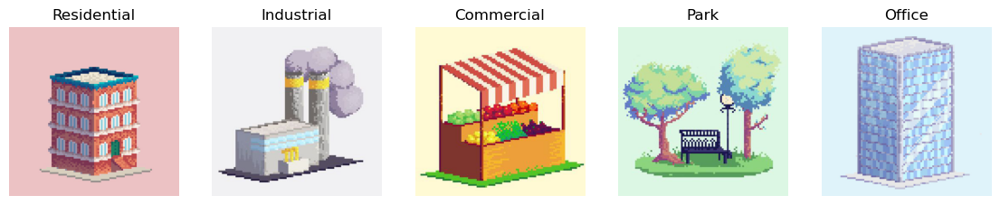

In [4]:
plot_districts()

## The Data
The mayor has provided you access to a large dataset of 500,000 possible zoning configurations. Additionally, the mayor asked the advisors to score some of these zoning configurations according to their subjective opinions of efficacy. Since the advisors are "only human" they have only been able to label ~5,000 configurations each. Some of their assessments may seem questionable to you, but they mayor insists that the advisors are "experts" and their ratings should not be questioned.

Let's take a look at the data. First, lets have a look at the zoning layouts you are given.

In [5]:
grids = load_grids() #Helper function we have provided to load the grids from the dataset
grids.shape #Check shape

(500000, 7, 7)

Let's examine the first grid in the dataset. It consists of 7x7 entries, each ranging from 0 to 4. The entries denote the district occupying the grid space (labeled above).

In [6]:
grids[0]

array([[4., 3., 0., 2., 3., 4., 4.],
       [0., 2., 0., 4., 3., 0., 3.],
       [4., 1., 0., 0., 1., 0., 3.],
       [2., 1., 2., 1., 3., 1., 1.],
       [2., 2., 2., 2., 4., 2., 3.],
       [2., 0., 0., 2., 0., 1., 0.],
       [4., 2., 4., 1., 3., 2., 4.]])

Let's visualize some of these grids. We have provided some utilities, mainly fucused on visualization, which we imported at the top of the notebook.

<Figure size 640x480 with 0 Axes>

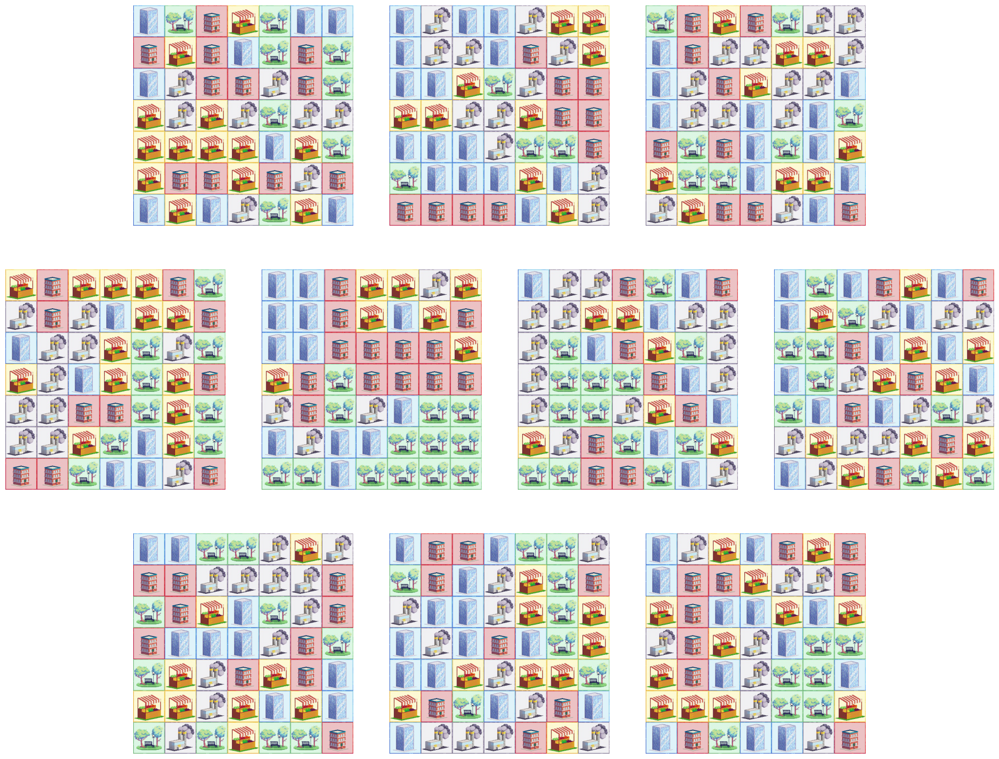

In [7]:
plot_n_grids(grids[:10]) #Plotting function that plots some number of grids in a clean layout

Now lets have a look at the advisor scores:

In [8]:
ratings = np.load("datasets/scores.npy") #Load advisor scores
score_order = ["Wellness", "Tax", "Transportation", "Business"] #This is the order of the scores in the dataset
ratings_df = pd.DataFrame(ratings, columns = score_order) #Create a dataframe
display(ratings_df) #Print dataframe

,Wellness,Tax,Transportation,Business
0,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN
...,...,...,...,...
499995,NaN,NaN,NaN,NaN
499996,NaN,NaN,NaN,NaN
499997,NaN,NaN,NaN,NaN
499998,NaN,NaN,NaN,NaN


We can see that the vast majority of ratings are NaN. After all, only 1% of the data is labeled. Let's confirm that there are the right number of NaNs in each column:

In [9]:
ratings_df.isna().sum()

Wellness          495001
Tax               495002
Transportation    495001
Business          495000
dtype: int64

Let's plot the distribution over the scores that are rated. We see that each advisor's scores are fairly uniform from 0 to 1.

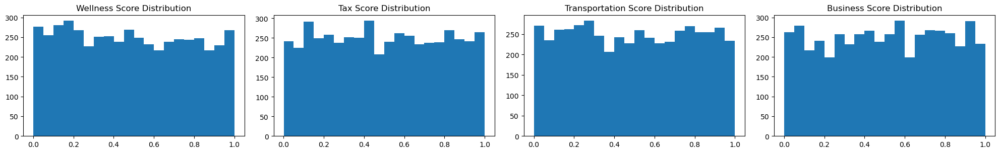

In [10]:
plot_ratings_histogram(ratings)

## The Task:
**Satisfying the Advisors:**
You are tasked with finding zoning layouts that "satisfy" all four advisors, meaning that they each assign a score of at least 0.85. If even one of the advisors rates a layout under a 0.85, it will be rejected as a candidate. You much identify designs from the dataset or generate new designs that *you believe* will be accepted by the advisors.

**Identifying a diverse set:** The mayor has asked for a variety of "diverse" design candidates -- 100 city layouts to be exact -- which they will show to the advisors. The overall diversity of all valid (non-rejected) designs will be calculated. With this diversity metric, more designs is always better, so it is in your best interest to ensure that as few of your submitted designs are rejected as possible.

We have provided the function we will use to evaluate diversity. Here are a few tests to build some intuition with the diversity score.

### Building Intuition for Diversity

In [11]:
diversity_score(grids[:100]) #Diversity of the first 100 grids in the dataset

0.7989527932385075

In [12]:
#If we set the top left corner to 0 in all grids, the diversity score should go down
g_1 = grids.copy()
g_1[:,0,0] = 0
diversity_score(g_1[:100])

0.78281179138322

In [13]:
#If some grids are the same, the diversity score should go down
g_2 = grids.copy()
g_2[0] = g_2[1]
diversity_score(g_2[:100])

0.798726035868893

In [14]:
#If we submit fewer grids, the diversity score should go down (as will occur if invalid designs are submitted)
diversity_score(g_2[:99]) #Diversity of the first 99 grids in the dataset

0.7826509997938569

<Figure size 640x480 with 0 Axes>

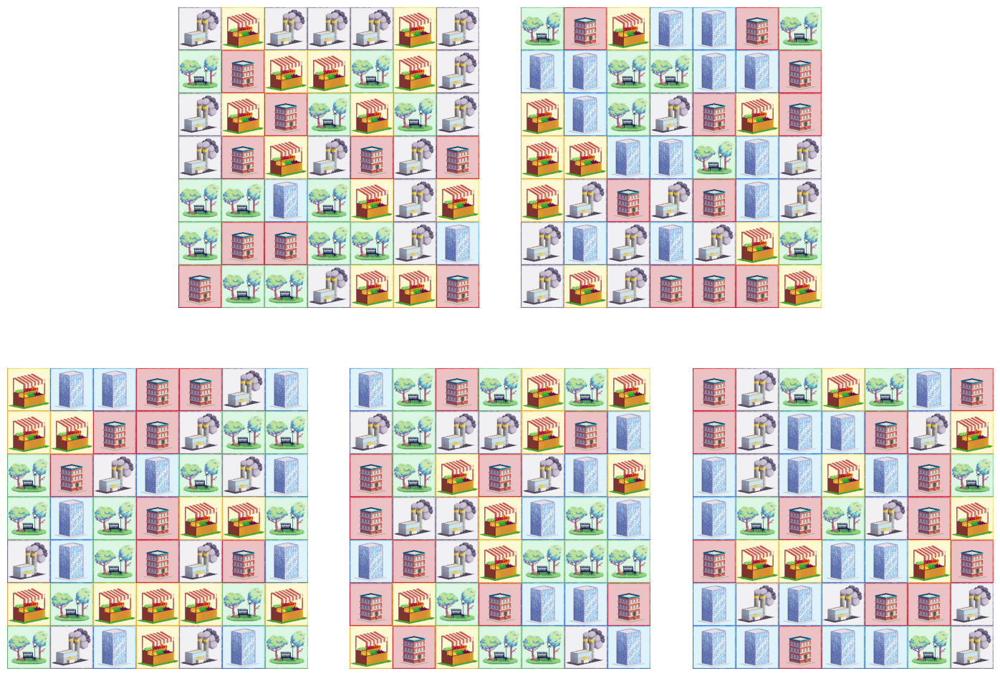

Diversity Score: 1.0


In [15]:
# A diverse set of five grids where no two cities have the same type of district in the same grid space
diverse_set = np.random.rand(5,7,7).argsort(0)
plot_n_grids(diverse_set)
print(f"Diversity Score: {diversity_score(diverse_set, 5)}")


<Figure size 640x480 with 0 Axes>

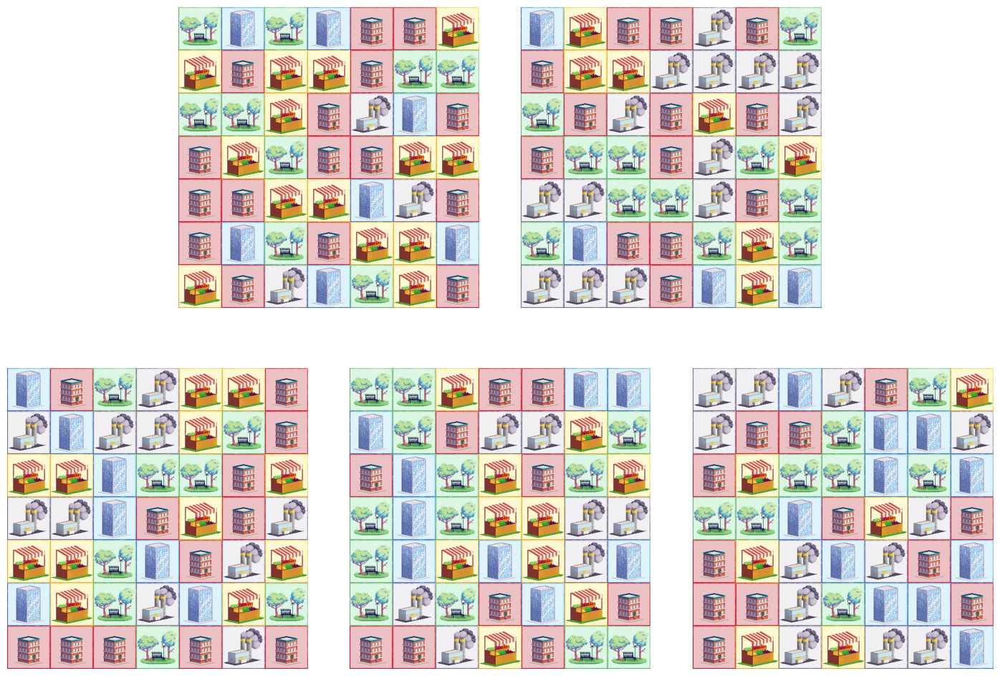

Diversity Score: 0.7959183673469388


In [16]:
#set of 5 grids where each district is independent and random with 20% probability for each district
random_set = np.random.randint(0,5, size=(5,7,7))
plot_n_grids(random_set)
print(f"Diversity Score: {diversity_score(random_set, 5)}")

<Figure size 640x480 with 0 Axes>

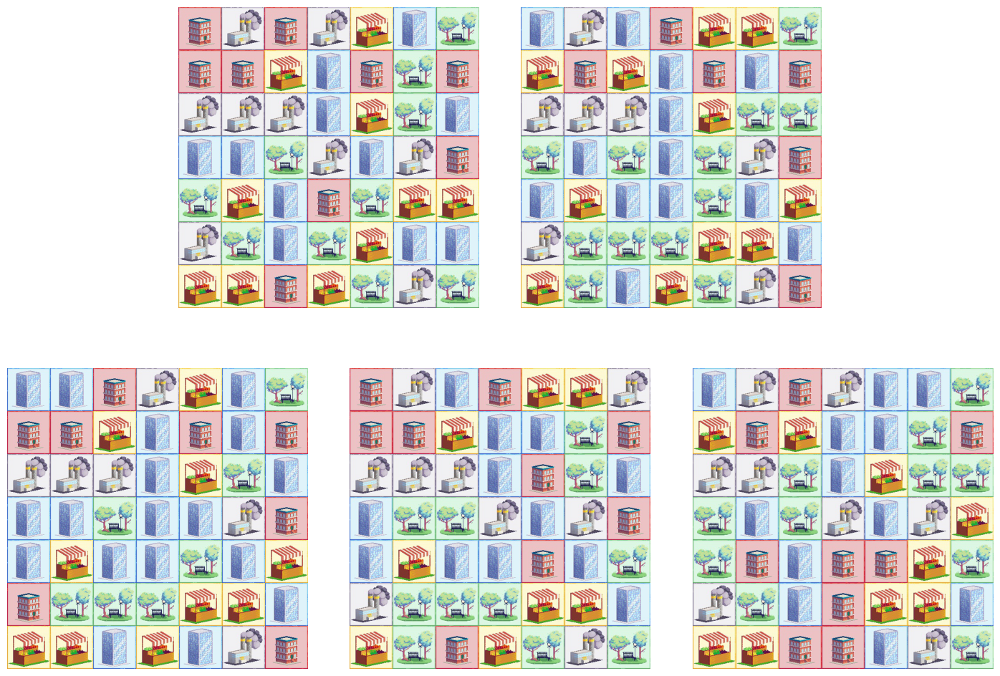

Diversity Score: 0.3510204081632653


In [17]:
#Set of five grids where each grid space only takes one of two types across all cities
r1 = np.random.randint(0,5,size=(7,7))
r2 = np.random.randint(0,5,size=(7,7))
mask = np.random.randint(0,2,size=(5,7,7))
non_diverse_set = r1 * mask + r2 * (1-mask)
plot_n_grids(non_diverse_set)
print(f"Diversity Score: {diversity_score(non_diverse_set, 5)}")

Assuming that all designs in your submitted sets are valid, you will be able to *exactly calculate* the diversity of your submitted sets.

# Your Code

Time to get coding! We recommend you start by training some regressors to predict the advisor scores. From there, it's up to you to generate or select city designs that you think will satisfy the requirements!



### Hints:
1. The advisors pay a lot of attention to the **adjacency** of districts as well as the **distances** from certain types of districts to others.
2. This is a grid-structured city. What **distance metric** is appropriate?
3. Though adding **novel** varied designs to your final set will increase the diversity score most, **duplicates** of valid designs will still slightly increase the diversity score, whereas invalid designs will not (see utils function for exact calculation).



### Training Regressors
We have provided code to train a simple AutoML regressor from AutoGluon that predicts advisor scores.


First, lets install autogluon:

We provided a small helper function that grabs the labeled subset of the dataset for some advisor:

In [18]:
grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,0]) #gets subset of the dataset rated by advisor 0
print(grids_subset.shape)
print(ratings_subset.shape)

(4999, 7, 7)
(4999,)


We will be using Autogluon Tabular, which requires flattened (tabular) data. Let's reshape our grids:

In [19]:
grids_subset = grids_subset.reshape(grids_subset.shape[0], 49) #Flatten our nx7x7 set of grids into nx49 set of vectors

Autogluon is time-consuming so we aren't going to bother with k-fold here. We do a simple train-test split to save time. Autogluon expects a single dataframe with both the "x" and "y" values and asks the user to specify the name of the column to predict. Therefore, we set up a dataframe with the predictions and the flattened feature vectors side by side:

In [20]:
grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)

#Convert to dataframe and specify dtype of object to ensure categorical handling of data
grids_train = pd.DataFrame(grids_train, columns = range(grids_subset.shape[1]), dtype = "object")
grids_test = pd.DataFrame(grids_test, columns = range(grids_subset.shape[1]), dtype = "object")

#Convert ratings to dataframe and label the column so we can tell Autogluon what to predict
preds_train = pd.DataFrame(ratings_train, columns = ["ratings"])

#Concatenate train grids and ratings together
all_train = pd.concat([grids_train, preds_train], axis=1)
display(all_train) #Have a look to check things over

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,ratings
0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,1.0,3.0,2.0,...,3.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,0.671171
1,2.0,3.0,1.0,4.0,3.0,3.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,1.0,4.0,0.0,0.008008
2,0.0,1.0,2.0,4.0,0.0,3.0,2.0,3.0,2.0,3.0,...,0.0,1.0,2.0,3.0,2.0,4.0,3.0,2.0,1.0,0.427928
3,3.0,0.0,4.0,1.0,1.0,2.0,0.0,2.0,1.0,4.0,...,0.0,4.0,2.0,1.0,2.0,1.0,3.0,1.0,0.0,0.153153
4,0.0,4.0,4.0,2.0,0.0,2.0,4.0,4.0,1.0,3.0,...,2.0,4.0,2.0,4.0,0.0,1.0,0.0,3.0,3.0,0.212713
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3744,2.0,2.0,0.0,2.0,4.0,2.0,2.0,0.0,1.0,0.0,...,0.0,4.0,1.0,4.0,0.0,1.0,2.0,2.0,1.0,0.024841
3745,2.0,2.0,4.0,4.0,1.0,4.0,2.0,0.0,2.0,2.0,...,2.0,4.0,4.0,3.0,2.0,4.0,0.0,1.0,4.0,0.311311
3746,4.0,4.0,0.0,3.0,3.0,1.0,0.0,1.0,1.0,1.0,...,4.0,3.0,4.0,0.0,4.0,0.0,3.0,4.0,2.0,0.537037
3747,1.0,4.0,4.0,1.0,1.0,1.0,1.0,1.0,4.0,3.0,...,3.0,3.0,0.0,0.0,3.0,3.0,2.0,2.0,3.0,0.957457


We finally train the model! (Please don't waste too much time fiddling with Autogluon parameters -- the whole point of AutoML is to avoid this!)

In [21]:
predictor = TabularPredictor(label="ratings").fit(all_train, hyperparameters = {'NN_TORCH':{}, 'GBM':{}, 'RF':{}, 'XT':{}, 'KNN':{}})

No path specified. Models will be saved in: "AutogluonModels\ag-20231106_183834\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231106_183834\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   25.12 GB / 510.77 GB (4.9%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (1.0, 0.0008403151805306168, 0.48599, 0.2909)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory

In [21]:
from sklearn.metrics import r2_score

preds_test = predictor.predict(grids_test)
preds_train = predictor.predict(grids_train)

def plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i):
    plt.scatter(ratings_train, preds_train, label='Train Set Preds', s=3, c = "#F08E18") #Train set in orange
    plt.scatter(ratings_test, preds_test, label='Test Set Preds', s=5, c = "#DC267F") #Test set in magenta
    plt.plot([0,1], [0,1], label="target", linewidth=3, c="k") # Target line in Black
    plt.xlabel("Actual Rating")
    plt.ylabel("Predicted Rating")
    plt.title(f"Advisor {i} Predictions")
    plt.legend()
    plt.show()
    print(f"Train Set R2 score: {r2_score(ratings_train, preds_train)}") #Calculate R2 score
    print(f"Test Set R2 score: {r2_score(ratings_test, preds_test)}")
plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, 0)

AttributeError: 'Net' object has no attribute 'predict'

A little function to get all the predictions for the dataset, but overwrite the prediction for the datapoints where the ground truth value is known.

In [23]:
def get_predictions(grids, ratings, predictor):
    grids = grids.reshape(grids.shape[0], 49)
    grids_df = pd.DataFrame(grids, columns = range(grids.shape[1]))
    predictions = predictor.predict(grids_df).values
    mask = np.where(~np.isnan(ratings))
    predictions[mask] = ratings[mask]
    return predictions
predictions = get_predictions(grids, ratings[:,0], predictor)


In [24]:
predictions.shape

(500000,)

Let's compile all of that into a single functon then loop over the four advisors to get a set of predictions for all of them:

In [25]:
#use autogluon to 
def fit_plot_predict(grids, ratings, i):
    grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,i]) #gets subset of the dataset rated by advisor 0
    grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)

    grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)
    grids_train = pd.DataFrame(grids_train, columns = range(grids_subset.shape[1]), dtype = "object") #specify dtype of object to ensure categorical handling of data
    grids_test = pd.DataFrame(grids_test, columns = range(grids_subset.shape[1]), dtype = "object")
    preds_train = pd.DataFrame(ratings_train, columns = ["ratings"])
    all_train = pd.concat([grids_train, preds_train], axis=1)

    predictor = TabularPredictor(label="ratings").fit(all_train, hyperparameters = {'NN_TORCH':{}, 'GBM':{}, 'RF':{}, 'XT':{}, 'KNN':{}})

    preds_test = predictor.predict(grids_test)
    preds_train = predictor.predict(grids_train)
    plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i)
    predictions = get_predictions(grids, ratings[:,i], predictor)
    return predictions, predictor

### Preds for all

No path specified. Models will be saved in: "AutogluonModels\ag-20231106_183939\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231106_183939\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   24.97 GB / 510.77 GB (4.9%)
Train Data Rows:    3748
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.999769053117783, 0.000898500117417629, 0.5015, 0.2896)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Avai

	Stage 1 Generators:
		Fitting AsTypeFeatureGenerator...
	Stage 2 Generators:
		Fitting FillNaFeatureGenerator...
	Stage 3 Generators:
		Fitting CategoryFeatureGenerator...
			Fitting CategoryMemoryMinimizeFeatureGenerator...
	Stage 4 Generators:
		Fitting DropUniqueFeatureGenerator...
	Stage 5 Generators:
		Fitting DropDuplicatesFeatureGenerator...
	Types of features in original data (raw dtype, special dtypes):
		('object', []) : 49 | ['0', '1', '2', '3', '4', ...]
	Types of features in processed data (raw dtype, special dtypes):
		('category', []) : 49 | ['0', '1', '2', '3', '4', ...]
	2.5s = Fit runtime
	49 features in original data used to generate 49 features in processed data.
	Train Data (Processed) Memory Usage: 0.2 MB (0.0% of available memory)
Data preprocessing and feature engineering runtime = 2.61s ...
AutoGluon will gauge predictive performance using evaluation metric: 'root_mean_squared_error'
	This metric's sign has been flipped to adhere to being higher_is_better. The

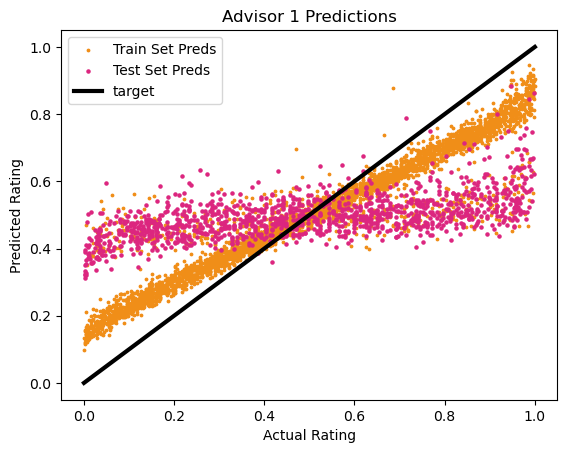

Train Set R2 score: 0.8022840743373466
Test Set R2 score: 0.22051244954251947


No path specified. Models will be saved in: "AutogluonModels\ag-20231106_184021\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231106_184021\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   24.81 GB / 510.77 GB (4.9%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9992992992992994, 0.000642515014272003, 0.49915, 0.28937)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	A

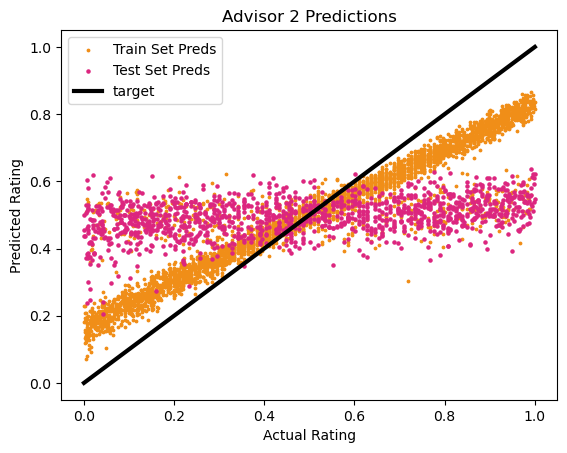

Train Set R2 score: 0.7756737012511536
Test Set R2 score: 0.1031323389329516


No path specified. Models will be saved in: "AutogluonModels\ag-20231106_184100\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231106_184100\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   24.66 GB / 510.77 GB (4.8%)
Train Data Rows:    3750
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9993096973713276, 0.0005841214972714321, 0.50519, 0.28978)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	

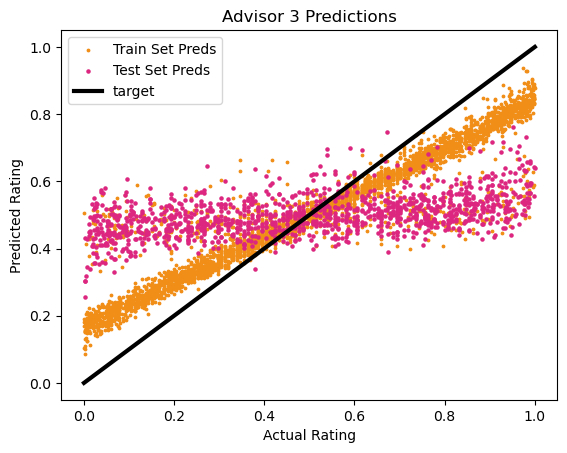

Train Set R2 score: 0.792000020755913
Test Set R2 score: 0.16121235820554924


In [26]:
all_predictions = [predictions]
all_predictors = [predictor]
for i in range(1,4):
    predictions, predictor = fit_plot_predict(grids, ratings, i)
    all_predictions.append(predictions)
    all_predictors.append(predictor)

We stack the predictions together and identify the lowest advisor score for each design. According to the regressors in the starting notebook, it's quite possible that none of the designs in the dataset are predicted to satisfy all four advisors with scores above 0.9 across the board. This is a problem! Despite this, we indentify the 100 designs with the highest minimum score and submit those.

In [27]:
final_prediction_array = np.stack(all_predictions).T
min_predictions = np.min(final_prediction_array, axis=1)
print(f"Number of valid grids (as predicted): {np.sum(min_predictions>0.85)}")
print(f"best predicted scores: {final_prediction_array[np.argmax(min_predictions)]}")
top_100_indices = np.argpartition(min_predictions, -100)[-100:] #indices of top 100 designs (as sorted by minimum advisor score)

Number of valid grids (as predicted): 0
best predicted scores: [0.6653603  0.69608545 0.9494494  0.63742894]


We visualize the score histograms and the grids of the top 10 designs.

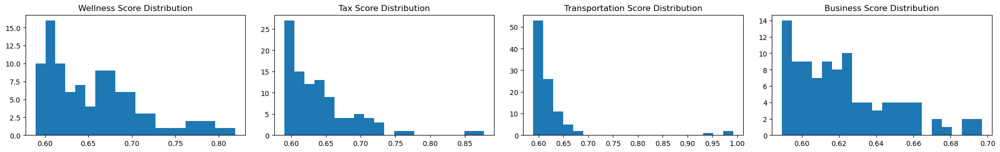

In [28]:
plot_ratings_histogram(final_prediction_array[top_100_indices])

<Figure size 640x480 with 0 Axes>

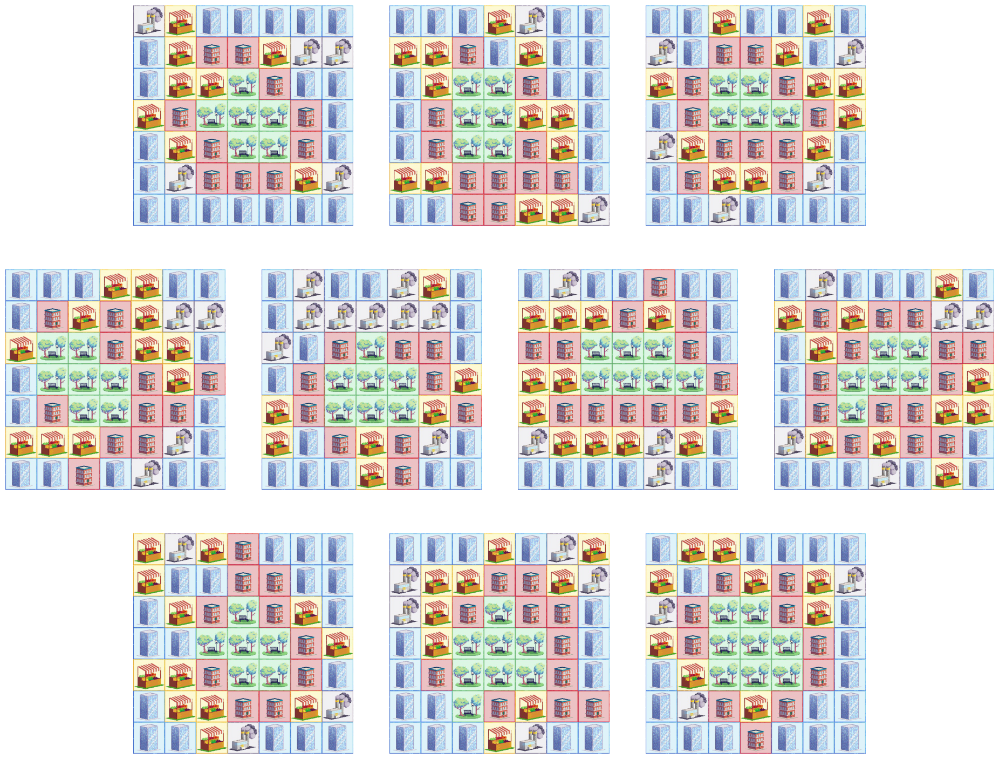

In [29]:
plot_n_grids(grids[top_100_indices][-10:])

### My Code (Spectral Clustering)

In [36]:
# Step 1: Import necessary libraries
from sklearn.cluster import SpectralClustering
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming all_train is your feature matrix
# Step 2: Apply Spectral Clustering
clustering = SpectralClustering(n_clusters=5, assign_labels="discretize", random_state=0).fit(all_train)
labels = clustering.labels_

# Step 3: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(all_train, labels, test_size=0.2, random_state=42)

# Step 4: Choose a model
clf = RandomForestClassifier()

# Step 5: Train the model
clf.fit(X_train, y_train)

# Step 6: Evaluate the model
y_pred = clf.predict(X_test)
print('Accuracy: ', accuracy_score(y_test, y_pred))

# Step 7: Make predictions
# Replace new_data with your actual new data
new_data = [[0.5, 0.5, 0.5, 0.5]]
print('Prediction: ', clf.predict(new_data))

C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\sklearn\utils\validation.py:1858: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


### My Code (ChatGPT)

In [ ]:
#imports
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import make_scorer, mean_squared_error
import numpy as np

In [ ]:

# Let's assume `df` is your DataFrame and it has been passed to this script
# df = ...
grids = load_grids()
grids.shape()
ratings = np.load("datasets/scores.npy") #Load advisor scores
ratings.shape()
score_order = ["Wellness", "Tax", "Transportation", "Business"] #This is the order of the scores in the dataset
ratings_df = pd.DataFrame(ratings, columns = score_order) #Create a dataframe
grids_subset, ratings_subset = select_rated_subset(grids, ratings)

In [ ]:

# Suppose your DataFrame looks like this:
# feature1, feature2, ..., featureN, score1, score2, score3, score4

# Aggregate the scores, here we take the minimum score to ensure high confidence
df['min_score'] = df[['score1', 'score2', 'score3', 'score4']].min(axis=1)

# Select features and target
X = df[['feature1', 'feature2', '...', 'featureN']]  # Replace '...' with actual feature names
y = df['min_score']

# Split the data
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the model
model = RandomForestRegressor(random_state=42)

# Define a custom scorer that penalizes predictions below 0.85 more
def custom_scorer(y_true, y_pred):
    penalty = 100.0  # You can adjust this penalty
    mse = mean_squared_error(y_true, y_pred)
    under_threshold_penalty = np.mean([(0.85 - pred)**2 if pred < 0.85 else 0 for pred in y_pred])
    return mse + penalty * under_threshold_penalty

scorer = make_scorer(custom_scorer, greater_is_better=False)

# Define grid search parameters
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20],
    # Add more parameters here
}

# Perform grid search with custom scorer
grid_search = GridSearchCV(model, param_grid, cv=5, scoring=scorer)
grid_search.fit(X_train, y_train)

# Get the best model
best_model = grid_search.best_estimator_

# Predict on validation set
y_pred = best_model.predict(X_val)

# Select the top 100 points with the highest predicted min_score over 0.85
threshold = 0.85
selected_indices = np.where(y_pred > threshold)[0]
top_indices = selected_indices[np.argsort(y_pred[selected_indices])[-100:]]

# Retrieve the original data points corresponding to top indices
selected_points = df.iloc[top_indices]

# Since we only want 100 points, if we have more, we select the top 100 based on prediction
if len(selected_points) > 100:
    selected_points = selected_points.nlargest(100, 'min_score')

# Save or print the selected points
# selected_points.to_csv('selected_points.csv', index=False)  # Uncomment to save to a CSV
print(selected_points)


### Basic Runs

In [1]:
from utils_public import *
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from autogluon.tabular import TabularPredictor
grids = load_grids()
ratings = np.load("datasets/scores.npy") #Load advisor scores

c:\Users\layal\anaconda3\envs\cp2env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Other Fxns

In [29]:
def get_predictions(grids, ratings, predictor):
    grids = grids.reshape(grids.shape[0], 49)
    grids_df = pd.DataFrame(grids, columns = range(grids.shape[1]))
    predictions = predictor.predict(grids_df).values
    mask = np.where(~np.isnan(ratings)) # ~ is the bitwise NOT operator
    predictions[mask] = ratings[mask]
    return predictions

In [20]:
from sklearn.metrics import r2_score

def plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i):
    plt.scatter(ratings_train, preds_train, label='Train Set Preds', s=3, c = "#F08E18") #Train set in orange
    plt.scatter(ratings_test, preds_test, label='Test Set Preds', s=5, c = "#DC267F") #Test set in magenta
    plt.plot([0,1], [0,1], label="target", linewidth=3, c="k") # Target line in Black
    plt.xlabel("Actual Rating")
    plt.ylabel("Predicted Rating")
    plt.title(f"Advisor {i} Predictions")
    plt.legend()
    plt.show()
    print(f"Train Set R2 score: {r2_score(ratings_train, preds_train)}") #Calculate R2 score
    print(f"Test Set R2 score: {r2_score(ratings_test, preds_test)}")

### Changing Predictor (Autogluon Try #1)

In [12]:
def fit_plot_predict(grids, ratings, i):
    grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,i]) #gets subset of the dataset rated by advisor 0
    grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)

    grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)
    grids_train = pd.DataFrame(grids_train, columns = range(grids_subset.shape[1]), dtype = "object") #specify dtype of object to ensure categorical handling of data
    grids_test = pd.DataFrame(grids_test, columns = range(grids_subset.shape[1]), dtype = "object")
    preds_train = pd.DataFrame(ratings_train, columns = ["ratings"])
    all_train = pd.concat([grids_train, preds_train], axis=1)

    from autogluon.tabular import TabularPredictor

    # # Define the search space
    # hyperparameters = {
    #     'NN_TORCH': {'num_epochs': [10, 20, 30, 40, 50], 'learning_rate': [0.1, 0.05, 0.01, 0.005, 0.001]},
    #     'GBM': {'num_boost_round': [100, 200, 300, 400, 500], 'learning_rate': [0.1, 0.05, 0.01, 0.005, 0.001]},
    #     'RF': {'n_estimators': [100, 200, 300, 400, 500], 'max_depth': [None, 5, 10, 15, 20]},
    #     'XT': {'n_estimators': [100, 200, 300, 400, 500], 'max_depth': [None, 5, 10, 15, 20]},
    #     'KNN': {'n_neighbors': [3, 5, 7, 9, 11, 13]}
    # }

    # # Define the HPO algorithm
    # hpo_kwargs = {
    #     'num_trials': 100,
    #     'scheduler' : 'local',
    #     'searcher': 'random'
    # }

    # # Train the predictor
    # predictor = TabularPredictor(label="ratings").fit(
    #     all_train,
    #     hyperparameters=hyperparameters,
    #     hyperparameter_tune_kwargs=hpo_kwargs
    # )
    
    #change predictor definition
    predictor = TabularPredictor(label="ratings").fit(all_train, hyperparameters = {
        'NN_TORCH':{'num_epochs':[50], 'learning_rate':[0.01]}, 
        'GBM':{'learning_rate':[0.01]}, 
        'RF':{}, 
        'XT':{}, 
        'KNN':{}
    })

    preds_test = predictor.predict(grids_test)
    preds_train = predictor.predict(grids_train)
    plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i)
    predictions = get_predictions(grids, ratings[:,i], predictor)
    return predictions, predictor

No path specified. Models will be saved in: "AutogluonModels\ag-20231107_011401\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231107_011401\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   31.45 GB / 510.77 GB (6.2%)
Train Data Rows:    3748
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9995316910443931, 0.000898500117417629, 0.49556, 0.28834)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	A

	Stage 1 Generators:
		Fitting AsTypeFeatureGenerator...
	Stage 2 Generators:
		Fitting FillNaFeatureGenerator...
	Stage 3 Generators:
		Fitting CategoryFeatureGenerator...
			Fitting CategoryMemoryMinimizeFeatureGenerator...
	Stage 4 Generators:
		Fitting DropUniqueFeatureGenerator...
	Stage 5 Generators:
		Fitting DropDuplicatesFeatureGenerator...
	Types of features in original data (raw dtype, special dtypes):
		('object', []) : 49 | ['0', '1', '2', '3', '4', ...]
	Types of features in processed data (raw dtype, special dtypes):
		('category', []) : 49 | ['0', '1', '2', '3', '4', ...]
	2.0s = Fit runtime
	49 features in original data used to generate 49 features in processed data.
	Train Data (Processed) Memory Usage: 0.2 MB (0.0% of available memory)
Data preprocessing and feature engineering runtime = 2.11s ...
AutoGluon will gauge predictive performance using evaluation metric: 'root_mean_squared_error'
	This metric's sign has been flipped to adhere to being higher_is_better. The

[1000]	valid_set's rmse: 0.170269
[2000]	valid_set's rmse: 0.152111
[3000]	valid_set's rmse: 0.146275
[4000]	valid_set's rmse: 0.144647
[5000]	valid_set's rmse: 0.143991
[6000]	valid_set's rmse: 0.143703
[7000]	valid_set's rmse: 0.143576
[8000]	valid_set's rmse: 0.143598
[9000]	valid_set's rmse: 0.143628


	-0.1436	 = Validation score   (-root_mean_squared_error)
	51.09s	 = Training   runtime
	0.45s	 = Validation runtime
Fitting model: RandomForest ...
	-0.2641	 = Validation score   (-root_mean_squared_error)
	4.99s	 = Training   runtime
	0.15s	 = Validation runtime
Fitting model: ExtraTrees ...
	-0.2644	 = Validation score   (-root_mean_squared_error)
	3.75s	 = Training   runtime
	0.22s	 = Validation runtime
Fitting model: NeuralNetTorch ...
		'<=' not supported between instances of 'float' and 'list'
Detailed Traceback:
Traceback (most recent call last):
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1733, in _train_and_save
    model = self._train_single(X, y, model, X_val, y_val, total_resources=total_resources, **model_fit_kwargs)
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1684, in _train_single
    model = model.fit(X=X, y=y, X_val=X_

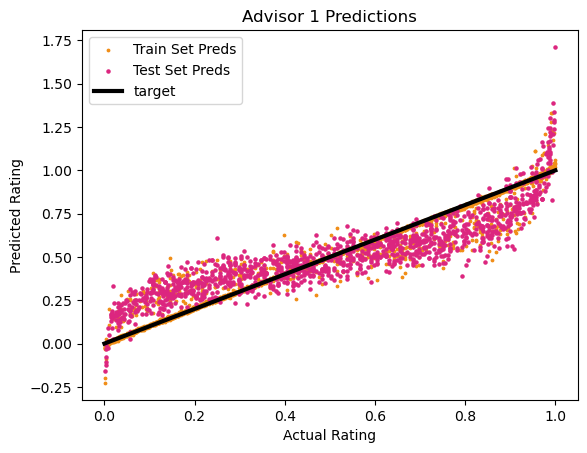

Train Set R2 score: 0.9664392189642175
Test Set R2 score: 0.774582964734774


No path specified. Models will be saved in: "AutogluonModels\ag-20231107_011942\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231107_011942\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   31.27 GB / 510.77 GB (6.1%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (1.0, 0.000642515014272003, 0.50178, 0.29128)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory

[1000]	valid_set's rmse: 0.255081
[2000]	valid_set's rmse: 0.251175
[3000]	valid_set's rmse: 0.248615
[4000]	valid_set's rmse: 0.247789


	-0.2476	 = Validation score   (-root_mean_squared_error)
	19.17s	 = Training   runtime
	0.13s	 = Validation runtime
Fitting model: RandomForest ...
	-0.2746	 = Validation score   (-root_mean_squared_error)
	3.93s	 = Training   runtime
	0.14s	 = Validation runtime
Fitting model: ExtraTrees ...
	-0.2773	 = Validation score   (-root_mean_squared_error)
	2.85s	 = Training   runtime
	0.14s	 = Validation runtime
Fitting model: NeuralNetTorch ...
		'<=' not supported between instances of 'float' and 'list'
Detailed Traceback:
Traceback (most recent call last):
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1733, in _train_and_save
    model = self._train_single(X, y, model, X_val, y_val, total_resources=total_resources, **model_fit_kwargs)
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1684, in _train_single
    model = model.fit(X=X, y=y, X_val=X_

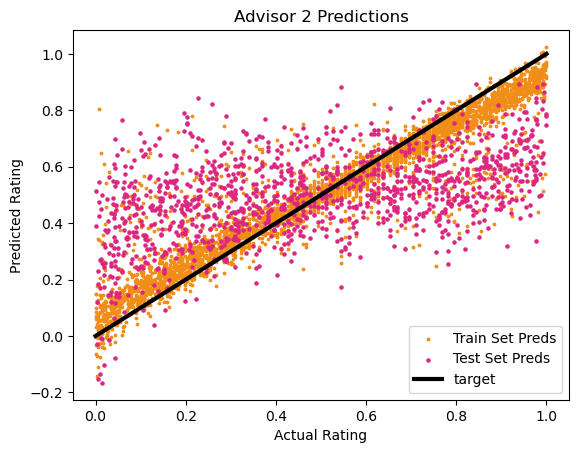

Train Set R2 score: 0.8736698461958492
Test Set R2 score: 0.24876035029312527


No path specified. Models will be saved in: "AutogluonModels\ag-20231107_012140\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231107_012140\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   31.11 GB / 510.77 GB (6.1%)
Train Data Rows:    3750
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9993096973713276, 0.0009361947285035282, 0.50368, 0.28964)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	

[1000]	valid_set's rmse: 0.196859
[2000]	valid_set's rmse: 0.189621
[3000]	valid_set's rmse: 0.188261
[4000]	valid_set's rmse: 0.188033


	-0.1879	 = Validation score   (-root_mean_squared_error)
	17.58s	 = Training   runtime
	0.08s	 = Validation runtime
Fitting model: RandomForest ...
	-0.2529	 = Validation score   (-root_mean_squared_error)
	4.02s	 = Training   runtime
	0.12s	 = Validation runtime
Fitting model: ExtraTrees ...
	-0.2542	 = Validation score   (-root_mean_squared_error)
	2.55s	 = Training   runtime
	0.11s	 = Validation runtime
Fitting model: NeuralNetTorch ...
		'<=' not supported between instances of 'float' and 'list'
Detailed Traceback:
Traceback (most recent call last):
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1733, in _train_and_save
    model = self._train_single(X, y, model, X_val, y_val, total_resources=total_resources, **model_fit_kwargs)
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1684, in _train_single
    model = model.fit(X=X, y=y, X_val=X_

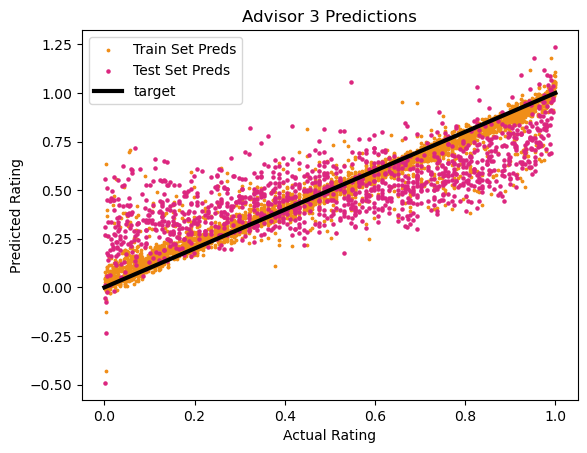

Train Set R2 score: 0.9292647153170748
Test Set R2 score: 0.5427812423517766


In [13]:
#run code for all advisors
all_predictions = []
all_predictors = []
for i in range(1,4):
    predictions, predictor = fit_plot_predict(grids, ratings, i)
    all_predictions.append(predictions)
    all_predictors.append(predictor)

No path specified. Models will be saved in: "AutogluonModels\ag-20231107_023706\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231107_023706\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   30.90 GB / 510.77 GB (6.0%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (1.0, 0.0008403151805306168, 0.4857, 0.29229)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory

[1000]	valid_set's rmse: 0.202862
[2000]	valid_set's rmse: 0.190433
[3000]	valid_set's rmse: 0.186243
[4000]	valid_set's rmse: 0.185153
[5000]	valid_set's rmse: 0.184676
[6000]	valid_set's rmse: 0.184585
[7000]	valid_set's rmse: 0.184476
[8000]	valid_set's rmse: 0.184388
[9000]	valid_set's rmse: 0.184333
[10000]	valid_set's rmse: 0.184351


	-0.1843	 = Validation score   (-root_mean_squared_error)
	36.74s	 = Training   runtime
	0.66s	 = Validation runtime
Fitting model: RandomForest ...
	-0.2604	 = Validation score   (-root_mean_squared_error)
	4.27s	 = Training   runtime
	0.17s	 = Validation runtime
Fitting model: ExtraTrees ...
	-0.2604	 = Validation score   (-root_mean_squared_error)
	2.76s	 = Training   runtime
	0.17s	 = Validation runtime
Fitting model: NeuralNetTorch ...
		'<=' not supported between instances of 'float' and 'list'
Detailed Traceback:
Traceback (most recent call last):
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1733, in _train_and_save
    model = self._train_single(X, y, model, X_val, y_val, total_resources=total_resources, **model_fit_kwargs)
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1684, in _train_single
    model = model.fit(X=X, y=y, X_val=X_

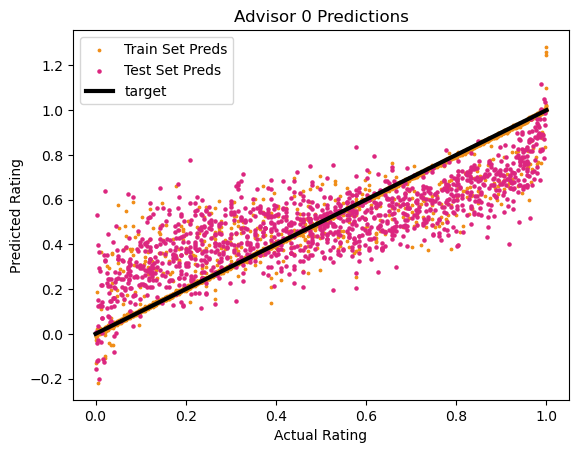

Train Set R2 score: 0.9467469040712199
Test Set R2 score: 0.6099731545086702


In [22]:
for i in range(1):
    predictions, predictor = fit_plot_predict(grids, ratings, i)
    all_predictions.append(predictions)
    all_predictors.append(predictor)

In [24]:
#determine what the 100 grid scores resulted in
final_prediction_array = np.stack(all_predictions).T
min_predictions = np.min(final_prediction_array, axis=1)
print(f"Number of valid grids (as predicted): {np.sum(min_predictions>0.85)}")
print(f"best predicted scores: {final_prediction_array[np.argmax(min_predictions)]}")
top_100_indices = np.argpartition(min_predictions, -100)[-100:] #indices of top 100 designs (as sorted by minimum advisor score)

Number of valid grids (as predicted): 0
best predicted scores: [0.8359293  0.98004997 0.963675   0.8073551 ]


In [27]:
diversity_score(final_submission)


0.53853638425067

### Neural Net (Autogluon)

In [34]:
def fit_plot_predict(grids, ratings, i):
    grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,i]) #gets subset of the dataset rated by advisor 0
    grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)

    grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)
    grids_train = pd.DataFrame(grids_train, columns = range(grids_subset.shape[1]), dtype = "object") #specify dtype of object to ensure categorical handling of data
    grids_test = pd.DataFrame(grids_test, columns = range(grids_subset.shape[1]), dtype = "object")
    preds_train = pd.DataFrame(ratings_train, columns = ["ratings"])
    all_train = pd.concat([grids_train, preds_train], axis=1)

    from autogluon.tabular import TabularPredictor

    from autogluon.common import space

    nn_options = {  # specifies non-default hyperparameter values for neural network models
        'num_epochs': 10,  # number of training epochs (controls training time of NN models)
        'learning_rate': space.Real(1e-4, 1e-2, default=5e-4, log=True),  # learning rate used in training (real-valued hyperparameter searched on log-scale)
        'activation': space.Categorical('relu', 'softrelu', 'tanh'),  # activation function used in NN (categorical hyperparameter, default = first entry)
        'dropout_prob': space.Real(0.0, 0.5, default=0.1),  # dropout probability (real-valued hyperparameter)
    }

    gbm_options = {  # specifies non-default hyperparameter values for lightGBM gradient boosted trees
        'num_boost_round': 100,  # number of boosting rounds (controls training time of GBM models)
        'num_leaves': space.Int(lower=26, upper=66, default=36),  # number of leaves in trees (integer hyperparameter)
    }

    hyperparameters = {  # hyperparameters of each model type
                    'GBM': gbm_options,
                    'NN_TORCH': nn_options,  # : comment this line out if you get errors on Mac OSX
                    }  # When these keys are missing from hyperparameters dict, no models of that type are trained

    time_limit = 2*60  # train various models for ~2 min
    num_trials = 5  # try at most 5 different hyperparameter configurations for each type of model
    search_strategy = 'auto'  # to tune hyperparameters using random search routine with a local scheduler

    hyperparameter_tune_kwargs = {  # HPO is not performed unless hyperparameter_tune_kwargs is specified
        'num_trials': num_trials,
        'scheduler' : 'local',
        'searcher': search_strategy,
    }  # Refer to TabularPredictor.fit docstring for all valid values

    predictor = TabularPredictor(label='ratings').fit(
        all_train,
        time_limit=time_limit,
        hyperparameters=hyperparameters,
        hyperparameter_tune_kwargs=hyperparameter_tune_kwargs,
    )
    # predictor = TabularPredictor(label="ratings").fit(all_train, hyperparameters = {
    #     'NN_TORCH': {
    #     'num_epochs': 50,
    #     'learning_rate': 0.01,
    #     'activation': 'relu',
    #     'layers': [100, 100],
    #     'dropout_prob': 0.1
    # }})

    preds_test = predictor.predict(grids_test)
    preds_train = predictor.predict(grids_train)
    plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i)
    predictions = get_predictions(grids, ratings[:,i], predictor)
    return predictions, predictor

No path specified. Models will be saved in: "AutogluonModels\ag-20231107_171439\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231107_171439\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   28.89 GB / 510.77 GB (5.7%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (1.0, 0.0008403151805306168, 0.4857, 0.29229)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...


Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    5867.92 MB
	Train Data (Original)  Memory Usage: 5.88 MB (0.1% of available memory)
	Inferring data type of each feature based on column values. Set feature_metadata_in to manually specify special dtypes of the features.
	Stage 1 Generators:
		Fitting AsTypeFeatureGenerator...
	Stage 2 Generators:
		Fitting FillNaFeatureGenerator...
	Stage 3 Generators:
		Fitting CategoryFeatureGenerator...
			Fitting CategoryMemoryMinimizeFeatureGenerator...
	Stage 4 Generators:
		Fitting DropUniqueFeatureGenerator...
	Stage 5 Generators:
		Fitting DropDuplicatesFeatureGenerator...
	Types of features in original data (raw dtype, special dtypes):
		('object', []) : 49 | ['0', '1', '2', '3', '4', ...]
	Types of features in processed data (raw dtype, special dtypes):
		('category', []) : 49 | ['0', '1', '2', '3', '4', ...]
	0.8s = Fit runtime
	49 features in original data used to generate 49 features in processed data.
	Train

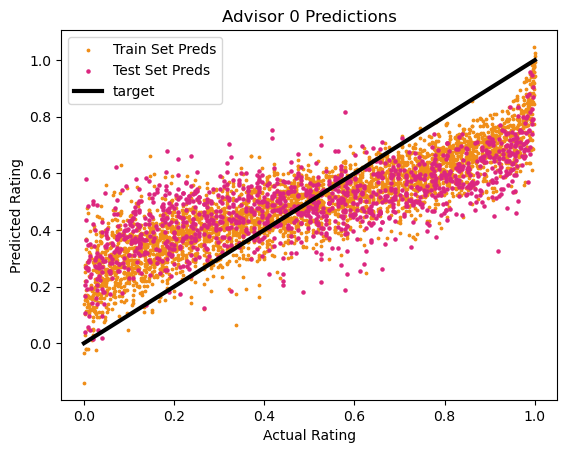

Train Set R2 score: 0.6728486586137394
Test Set R2 score: 0.4543869239505043


No path specified. Models will be saved in: "AutogluonModels\ag-20231107_171453\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231107_171453\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   28.89 GB / 510.77 GB (5.7%)
Train Data Rows:    3748
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9995316910443931, 0.000898500117417629, 0.49556, 0.28834)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeat

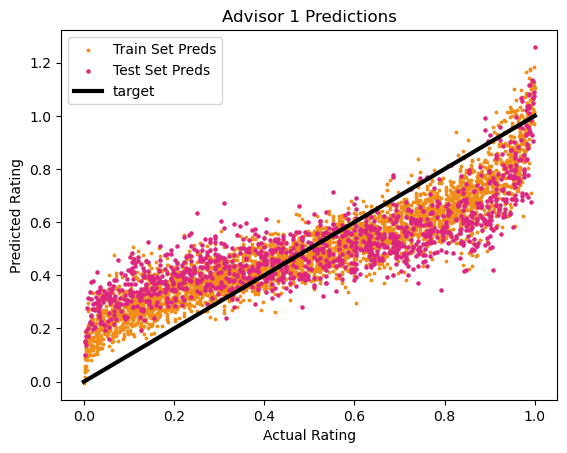

Train Set R2 score: 0.7836128230790711
Test Set R2 score: 0.5967596161119517


No path specified. Models will be saved in: "AutogluonModels\ag-20231107_171505\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231107_171505\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   28.89 GB / 510.77 GB (5.7%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (1.0, 0.000642515014272003, 0.50178, 0.29128)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...

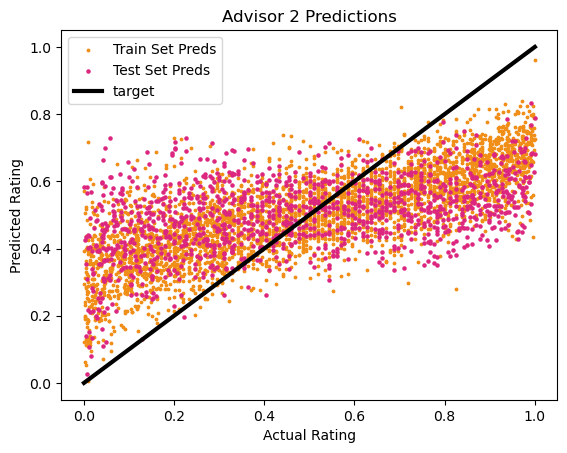

Train Set R2 score: 0.48553678495448604
Test Set R2 score: 0.1880950227595175


No path specified. Models will be saved in: "AutogluonModels\ag-20231107_171520\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231107_171520\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   28.89 GB / 510.77 GB (5.7%)
Train Data Rows:    3750
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9993096973713276, 0.0009361947285035282, 0.50368, 0.28964)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFea

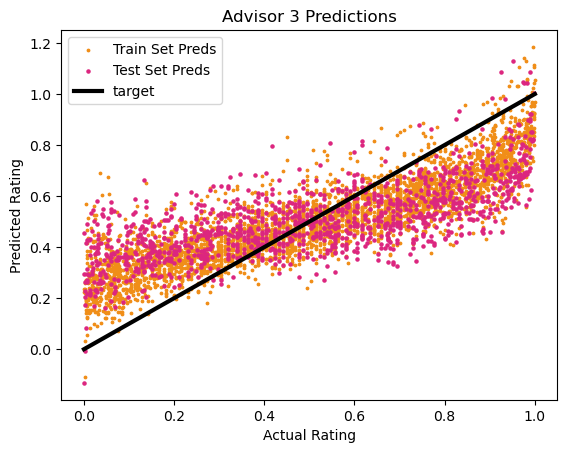

Train Set R2 score: 0.679653830412879
Test Set R2 score: 0.4541222671909998


In [35]:
#run code for all advisors
all_predictions = []
all_predictors = []
for i in range(0,4):
    predictions, predictor = fit_plot_predict(grids, ratings, i)
    all_predictions.append(predictions)
    all_predictors.append(predictor)

In [42]:
#determine what the 100 grid scores resulted in
final_prediction_array = np.stack(all_predictions).T
min_predictions = np.min(final_prediction_array, axis=1)
print(f"Number of valid grids (as predicted): {np.sum(min_predictions>0.85)}")
print(f"best predicted scores: {final_prediction_array[np.argmax(min_predictions)]}")
top_100_indices = np.argpartition(min_predictions, -100)[-100:] #indices of top 100 designs (as sorted by minimum advisor score)

Number of valid grids (as predicted): 0
best predicted scores: [0.8056193  0.80807453 0.7856792  0.83850324]


In [41]:
diversity_score(final_submission)

0.5350319521748094

### Neural Net Try 2 (Autogluon)

In [44]:
def fit_plot_predict(grids, ratings, i):
    grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,i]) #gets subset of the dataset rated by advisor 0
    grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)

    grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)
    grids_train = pd.DataFrame(grids_train, columns = range(grids_subset.shape[1]), dtype = "object") #specify dtype of object to ensure categorical handling of data
    grids_test = pd.DataFrame(grids_test, columns = range(grids_subset.shape[1]), dtype = "object")
    preds_train = pd.DataFrame(ratings_train, columns = ["ratings"])
    all_train = pd.concat([grids_train, preds_train], axis=1)

    from autogluon.tabular import TabularPredictor

    from autogluon.common import space

    nn_options = {  # specifies non-default hyperparameter values for neural network models
        'num_epochs': 100,  # number of training epochs (controls training time of NN models)
        'learning_rate': space.Real(1e-4, 1e-2, default=5e-4, log=True),  # learning rate used in training (real-valued hyperparameter searched on log-scale)
        'activation': space.Categorical('relu', 'softrelu', 'tanh'),  # activation function used in NN (categorical hyperparameter, default = first entry)
        'dropout_prob': space.Real(0.0, 0.5, default=0.1),  # dropout probability (real-valued hyperparameter)
    }

    gbm_options = {  # specifies non-default hyperparameter values for lightGBM gradient boosted trees
        'num_boost_round': 100,  # number of boosting rounds (controls training time of GBM models)
        'num_leaves': space.Int(lower=26, upper=66, default=36),  # number of leaves in trees (integer hyperparameter)
    }

    hyperparameters = {  # hyperparameters of each model type
                    'GBM': gbm_options,
                    'NN_TORCH': nn_options,  # : comment this line out if you get errors on Mac OSX
                    }  # When these keys are missing from hyperparameters dict, no models of that type are trained

    time_limit = 2*60  # train various models for ~2 min
    num_trials = 15  # try at most 5 different hyperparameter configurations for each type of model
    search_strategy = 'auto'  # to tune hyperparameters using random search routine with a local scheduler

    hyperparameter_tune_kwargs = {  # HPO is not performed unless hyperparameter_tune_kwargs is specified
        'num_trials': num_trials,
        'scheduler' : 'local',
        'searcher': search_strategy,
    }  # Refer to TabularPredictor.fit docstring for all valid values

    predictor = TabularPredictor(label='ratings').fit(
        all_train,
        time_limit=time_limit,
        hyperparameters=hyperparameters,
        hyperparameter_tune_kwargs=hyperparameter_tune_kwargs,
    )
    # predictor = TabularPredictor(label="ratings").fit(all_train, hyperparameters = {
    #     'NN_TORCH': {
    #     'num_epochs': 50,
    #     'learning_rate': 0.01,
    #     'activation': 'relu',
    #     'layers': [100, 100],
    #     'dropout_prob': 0.1
    # }})

    preds_test = predictor.predict(grids_test)
    preds_train = predictor.predict(grids_train)
    plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i)
    predictions = get_predictions(grids, ratings[:,i], predictor)
    return predictions, predictor

No path specified. Models will be saved in: "AutogluonModels\ag-20231107_172051\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231107_172051\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   28.89 GB / 510.77 GB (5.7%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (1.0, 0.0008403151805306168, 0.48628, 0.2914)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...

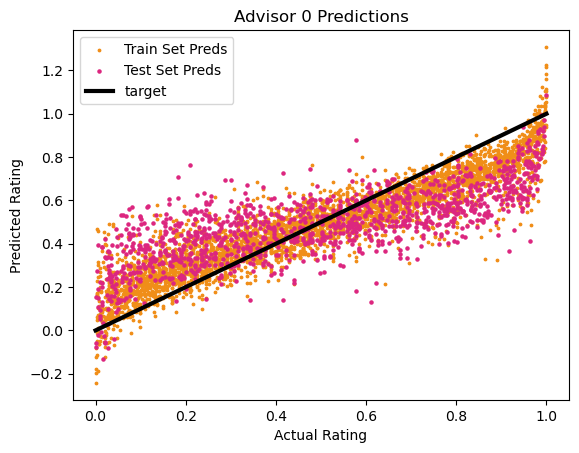

Train Set R2 score: 0.8212999532428369
Test Set R2 score: 0.5336204810129456


No path specified. Models will be saved in: "AutogluonModels\ag-20231107_172111\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231107_172111\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   28.89 GB / 510.77 GB (5.7%)
Train Data Rows:    3748
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9995316910443931, 0.000898500117417629, 0.49556, 0.28834)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeat

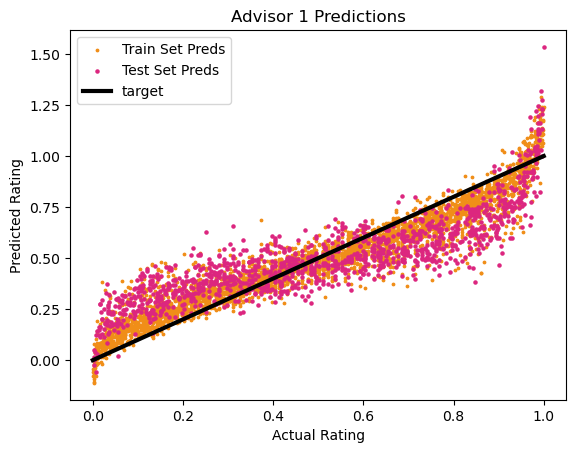

Train Set R2 score: 0.8948670480446761
Test Set R2 score: 0.7109977252896541


No path specified. Models will be saved in: "AutogluonModels\ag-20231107_172133\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231107_172133\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   28.88 GB / 510.77 GB (5.7%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (1.0, 0.000642515014272003, 0.50178, 0.29128)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...

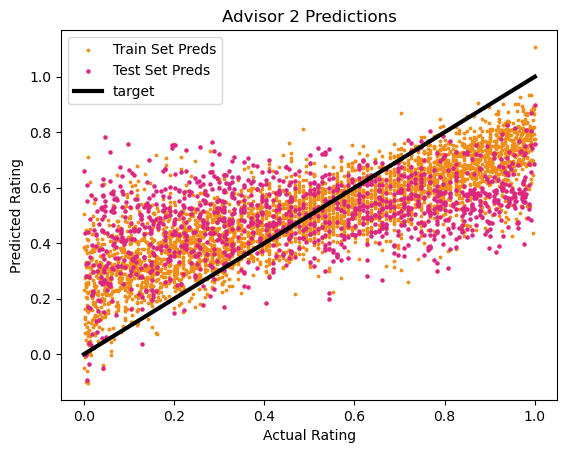

Train Set R2 score: 0.6349851260912374
Test Set R2 score: 0.2046815823862228


No path specified. Models will be saved in: "AutogluonModels\ag-20231107_172156\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231107_172156\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   28.88 GB / 510.77 GB (5.7%)
Train Data Rows:    3750
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9993096973713276, 0.0009361947285035282, 0.50368, 0.28964)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFea

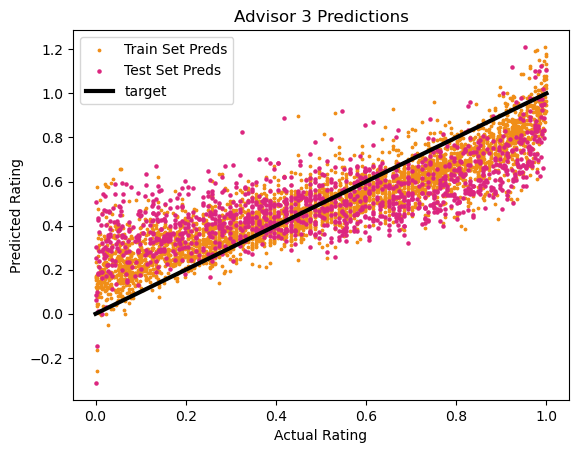

Train Set R2 score: 0.7869112740520576
Test Set R2 score: 0.5151205143233928


In [45]:
#run code for all advisors
all_predictions = []
all_predictors = []
for i in range(0,4):
    predictions, predictor = fit_plot_predict(grids, ratings, i)
    all_predictions.append(predictions)
    all_predictors.append(predictor)

In [46]:
#determine what the 100 grid scores resulted in
final_prediction_array = np.stack(all_predictions).T
min_predictions = np.min(final_prediction_array, axis=1)
print(f"Number of valid grids (as predicted): {np.sum(min_predictions>0.85)}")
print(f"best predicted scores: {final_prediction_array[np.argmax(min_predictions)]}")
top_100_indices = np.argpartition(min_predictions, -100)[-100:] #indices of top 100 designs (as sorted by minimum advisor score)

Number of valid grids (as predicted): 0
best predicted scores: [0.7912149  0.81446475 0.87999964 0.90691686]


In [47]:
diversity_score(final_submission)

0.5350319521748094

### Neural Net (Pytorch)

In [138]:
#imports
import torch
import torch.nn as nn
import torch.optim as optim
import transformers
from transformers import AutoConfig
from torch.utils.data import DataLoader, TensorDataset
import sklearn


In [139]:
grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,i]) #gets subset of the dataset rated by advisor 0
grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)

grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)
ratings_test

array([0.43243243, 0.23723724, 0.78028028, ..., 0.76276276, 0.45645646,
       0.88238238])

In [140]:
def nn_torch(grids, results, i):
    grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,i]) #gets subset of the dataset rated by advisor 0
    grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)
    # gridy=grids_subset.reshape(-1, 7, 7)

    grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)

    # Split into features and labels
    X_train = grids_train  # all columns except the last one
    y_train = ratings_train  # the last column

    # Convert numpy arrays to PyTorch tensors
    X_train_tensor = torch.tensor(X_train, dtype=torch.float)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float)

    # Create a TensorDataset from the tensors
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)

    # Create a DataLoader from the TensorDataset
    trainloader = DataLoader(train_dataset, batch_size=10, shuffle=True)

    # Define the network architecture
    class Net(nn.Module):
        def __init__(self):
            super(Net, self).__init__()
            self.fc1 = nn.Linear(49, 25)  # 49 input features, 25 output features
            self.fc2 = nn.Linear(25, 13)  
            self.fc3 = nn.Linear(13, 1) 
            self.activation = nn.Sigmoid()
        def forward(self, x):
            x = torch.relu(self.fc1(x))
            x = torch.relu(self.fc2(x))
            x = self.fc3(x)
            x = self.activation(x)
            return x

    # Create the network, loss function and optimizer
    net = Net() # Create the network
    net.train() # Set the network to training mode
    criterion = nn.MSELoss()  # For regression tasks
    optimizer = optim.AdamW(net.parameters(), lr=0.1)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=10, 
                                                     min_lr=1e-10,
                                                     verbose=True) # Reduce learning rate when a metric has stopped improving
    
    
    # Train the network
    for epoch in range(100):  # Loop over the dataset multiple times
        running_loss = 0.0 # Keep track of the loss
        for i, data in enumerate(trainloader, 0):  # Replace trainloader with your actual data loader
            inputs, labels = data # Get the inputs from the data loader
            optimizer.zero_grad()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            scheduler.step(loss)
            running_loss += loss.item()
    print(f'Epoch {epoch + 1}, loss: {running_loss / len(trainloader)}')
    
    # Assuming grids_test and ratings_test are your test data
    X_test = grids_test
    y_test = ratings_test

    # Convert numpy arrays to PyTorch tensors
    X_test_tensor = torch.tensor(X_test, dtype=torch.float)
    y_test_tensor = torch.tensor(y_test, dtype=torch.float)

    # Create a TensorDataset from the tensors
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

    # Create a DataLoader from the TensorDataset
    testloader = DataLoader(test_dataset, batch_size=1000)

    # Run the network on the test data and store the predictions
    # preds_test = []
    net.eval()
    preds_test = np.array(net(X_test_tensor).detach().numpy())
    preds_train = np.array(net(X_train_tensor).detach().numpy())

    # plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i)
        
    print('Finished Training')
    return preds_test, net #predictions for the test set

### Grid Search

In [141]:
grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,i]) #gets subset of the dataset rated by advisor 0
grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)
# gridy=grids_subset.reshape(-1, 7, 7)

grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)

# Split into features and labels
X_train = grids_train  # all columns except the last one
y_train = ratings_train  # the last column

# Convert numpy arrays to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float)
y_train_tensor = torch.tensor(y_train, dtype=torch.float)

# Create a TensorDataset from the tensors
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)

# Create a DataLoader from the TensorDataset
trainloader = DataLoader(train_dataset, batch_size=10, shuffle=True)


In [ ]:
# Define the network architecture
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(49, 25)  # 49 input features, 25 output features
        self.fc2 = nn.Linear(25, 13)  
        self.fc3 = nn.Linear(13, 1) 
        self.activation = nn.Sigmoid()
    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        x = self.activation(x)
        return x

# Create the network, loss function and optimizer
net = Net() # Create the network
criterion = nn.MSELoss()  # For regression tasks
optimizer = optim.AdamW(net.parameters(), lr=0.1)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=10, 
                                                    min_lr=1e-10,
                                                    verbose=True) # Reduce learning rate when a metric has stopped improving

param_grid={
    batch_size: [10, 20, 30, 40, 50]}

def nn_torch(grids, results, i):
    # Train the network
    net.train() # Set the network to training mode

    for epoch in range(100):  # Loop over the dataset multiple times
        running_loss = 0.0 # Keep track of the loss
        for i, data in enumerate(trainloader, 0):  # Replace trainloader with your actual data loader
            inputs, labels = data # Get the inputs from the data loader
            optimizer.zero_grad()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            scheduler.step(loss)
            running_loss += loss.item()
    print(f'Epoch {epoch + 1}, loss: {running_loss / len(trainloader)}')
    
    # Assuming grids_test and ratings_test are your test data
    X_test = grids_test
    y_test = ratings_test

    # Convert numpy arrays to PyTorch tensors
    X_test_tensor = torch.tensor(X_test, dtype=torch.float)
    y_test_tensor = torch.tensor(y_test, dtype=torch.float)

    # Create a TensorDataset from the tensors
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

    # Create a DataLoader from the TensorDataset
    testloader = DataLoader(test_dataset, batch_size=1000)

    # Run the network on the test data and store the predictions
    # preds_test = []
    net.eval()
    preds_test = np.array(net(X_test_tensor).detach().numpy())
    preds_train = np.array(net(X_train_tensor).detach().numpy())

    # plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i)
        
    print('Finished Training')
    return preds_test, net #predictions for the test set

In [136]:
#run code for all advisors
all_predictions = []
all_predictors = []
for i in range(0,4):
    predictions, predictor = nn_torch(grids, ratings, i)
    all_predictions.append(predictions)
    all_predictors.append(predictor)

C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([10])) that is different to the input size (torch.Size([10, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch 00020: reducing learning rate of group 0 to 1.0000e-02.
Epoch 00037: reducing learning rate of group 0 to 1.0000e-03.
Epoch 00048: reducing learning rate of group 0 to 1.0000e-04.
Epoch 00067: reducing learning rate of group 0 to 1.0000e-05.
Epoch 00078: reducing learning rate of group 0 to 1.0000e-06.
Epoch 00089: reducing learning rate of group 0 to 1.0000e-07.
Epoch 00100: reducing learning rate of group 0 to 1.0000e-08.


C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([9])) that is different to the input size (torch.Size([9, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch 100, loss: 0.08482266555229823
Finished Training
Epoch 00016: reducing learning rate of group 0 to 1.0000e-02.
Epoch 00027: reducing learning rate of group 0 to 1.0000e-03.
Epoch 00038: reducing learning rate of group 0 to 1.0000e-04.
Epoch 00049: reducing learning rate of group 0 to 1.0000e-05.
Epoch 00060: reducing learning rate of group 0 to 1.0000e-06.
Epoch 00071: reducing learning rate of group 0 to 1.0000e-07.
Epoch 00082: reducing learning rate of group 0 to 1.0000e-08.


C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([8])) that is different to the input size (torch.Size([8, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch 100, loss: 0.08748111813267072
Finished Training
Epoch 00016: reducing learning rate of group 0 to 1.0000e-02.
Epoch 00027: reducing learning rate of group 0 to 1.0000e-03.
Epoch 00055: reducing learning rate of group 0 to 1.0000e-04.
Epoch 00066: reducing learning rate of group 0 to 1.0000e-05.
Epoch 00077: reducing learning rate of group 0 to 1.0000e-06.
Epoch 00088: reducing learning rate of group 0 to 1.0000e-07.
Epoch 00099: reducing learning rate of group 0 to 1.0000e-08.
Epoch 100, loss: 0.08684923146168391
Finished Training
Epoch 00018: reducing learning rate of group 0 to 1.0000e-02.
Epoch 00041: reducing learning rate of group 0 to 1.0000e-03.
Epoch 00052: reducing learning rate of group 0 to 1.0000e-04.
Epoch 00063: reducing learning rate of group 0 to 1.0000e-05.
Epoch 00074: reducing learning rate of group 0 to 1.0000e-06.
Epoch 00085: reducing learning rate of group 0 to 1.0000e-07.
Epoch 00101: reducing learning rate of group 0 to 1.0000e-08.
Epoch 100, loss: 0.086

In [ ]:
def nn_torch(grids, results, i):
    grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,i]) #gets subset of the dataset rated by advisor 0
    grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)

    grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)
    # grids_train = pd.DataFrame(grids_train, columns = range(grids_subset.shape[1]), dtype = "object") #specify dtype of object to ensure categorical handling of data
    # grids_test = pd.DataFrame(grids_test, columns = range(grids_subset.shape[1]), dtype = "object")
    # preds_train = pd.DataFrame(ratings_train, columns = ["ratings"])
    # all_train = pd.concat([grids_train, preds_train], axis=1)
    
    # Convert DataFrame to numpy array
    # numpy_array = all_train.values

    # Split into features and labels
    X_train = grids_train  # all columns except the last one
    y_train = ratings_train  # the last column

    # Convert numpy arrays to PyTorch tensors
    X_train_tensor = torch.tensor(X_train, dtype=torch.float)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float)

    # Create a TensorDataset from the tensors
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)

    # Create a DataLoader from the TensorDataset
    trainloader = DataLoader(train_dataset, batch_size=1000, shuffle=True)

    # Define the network architecture
    class Net(nn.Module):
        def __init__(self):
            super(Net, self).__init__()
            self.fc1 = nn.Linear(49, 25)  # Replace 16 with the number of input features
            self.fc2 = nn.Linear(25, 1)  # Replace 1 with the number of output features
            self.activation = nn.Sigmoid()
        def forward(self, x):
            x = torch.relu(self.fc1(x))
            x = self.fc2(x)
            x = self.activation(x)
            return x

    # Create the network, loss function and optimizer
    net = Net()
    net.train()
    criterion = nn.MSELoss()  # For regression tasks
    # optimizer = optim.SGD(net.parameters(), lr=0.001)
    optimizer = optim.Adam(net.parameters(), lr=1e-3)
    # Train the network
    for epoch in range(10):  # Loop over the dataset multiple times
        running_loss = 0.0
        for i, data in enumerate(trainloader, 0):  # Replace trainloader with your actual data loader
            inputs, labels = data

            optimizer.zero_grad()
            
            outputs = net(inputs)
            # print(outputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
    print(f'Epoch {epoch + 1}, loss: {running_loss / len(trainloader)}')
    # preds_train=[]
    # preds_train.extend(outputs.detach().numpy())
    # preds_train = np.array(preds_train)
    preds_train = np.array(outputs.detach().numpy())
    # Assuming grids_test and ratings_test are your test data
    X_test = grids_test
    y_test = ratings_test

    # Convert numpy arrays to PyTorch tensors
    X_test_tensor = torch.tensor(X_test, dtype=torch.float)
    y_test_tensor = torch.tensor(y_test, dtype=torch.float)

    # Create a TensorDataset from the tensors
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

    # Create a DataLoader from the TensorDataset
    testloader = DataLoader(test_dataset, batch_size=1000)

    # Run the network on the test data and store the predictions
    # preds_test = []
    net.eval()
    for data in testloader:
        inputs, labels = data
        outputs = net(inputs)
        # preds_test.extend(outputs.detach().numpy())
        preds_test =

    # Convert list to numpy array
    preds_test = np.array(preds_test)

    # Run the network on the train data and store the predictions
    preds_train = []
    for data in testloader:
        inputs, labels = data
        outputs = net(inputs)
        preds_train.extend(outputs.detach().numpy())

    # Convert list to numpy array
    preds_train = np.array(preds_train)

    plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i)
        
    print('Finished Training')
    return preds_test, net #predictions for the test set

### Preparing a submission
Let's prepare a submission. We expect the final submission to be a 100x7x7 numpy array of integers between 0 and 4, inclusive. Note: we do NOT need your predicted scores. We will ask the advisors to score your submissions directly!
You can verify that your submission is formatted properly with the following asserts:

In [137]:
#determine what the 100 grid scores resulted in
final_prediction_array = np.stack(all_predictions).T[0]
min_predictions = np.min(final_prediction_array, axis=1)
print(f"Number of valid grids (as predicted): {np.sum(min_predictions>0.85)}")
print(f"best predicted scores: {final_prediction_array[np.argmax(min_predictions)]}")
top_100_indices = np.argpartition(min_predictions, -100)[-100:] #indices of top 100 designs (as sorted by minimum advisor score)

Number of valid grids (as predicted): 0
best predicted scores: [0.5090348 0.6029127 0.5441554 0.5146131]


In [91]:
final_submission = grids[top_100_indices].astype(int)

In [92]:
diversity_score(final_submission)

0.7971511028653886

In [78]:
assert final_submission.shape == (100, 7, 7)
assert final_submission.dtype == int
assert np.all(np.greater_equal(final_submission, 0) & np.less_equal(final_submission, 4))

We need each submission to have a unique submission ID for scoring. Generate a random ID and save the file using that ID:

In [51]:
id = np.random.randint(1e8, 1e9-1)
np.save(f"{id}.npy", final_submission)

### Multi Classification

In [ ]:
from sklearn.datasets import make_classification
from sklearn.multioutput import MultiOutputClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils import shuffle
import numpy as np
X, y1 = make_classification(n_samples=10, n_features=100,
                             n_informative=30, n_classes=3,
                             random_state=1)
y2 = shuffle(y1, random_state=1)
y3 = shuffle(y1, random_state=2)
Y = np.vstack((y1, y2, y3)).T
n_samples, n_features = X.shape # 10,100
n_outputs = Y.shape[1] # 3
n_classes = 3
forest = RandomForestClassifier(random_state=1)
multi_target_forest = MultiOutputClassifier(forest, n_jobs=2)
multi_target_forest.fit(X, Y).predict(X)

## Bonus: Training a Generative Model

You may also want to train a generative model to create new grid designs to supplement the options provided from the mayor. You may find that randomly generated designs don't tend to perform very well. Here, we have provided a simple Variational Autoencoder implementation, which can be used to synthesize new grids.

In [33]:
grids_OH = (np.arange(5) == grids[...,None]).astype(int) #One-hot encode grids
print(grids_OH.shape)

(500000, 7, 7, 5)


In [34]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

class VAE(nn.Module): #Create VAE class inheriting from pytorch nn Module class
    def __init__(self, input_channels, hidden_size, num_layers, latent_dim, image_size, kernel_size, stride):
        super(VAE, self).__init__()

        # Create encoder model
        self.encoder = Encoder(input_channels, hidden_size, num_layers, latent_dim, image_size, kernel_size, stride)

        #Create decoder after calculating input size for decoder
        decoder_input_size = self.calculate_decoder_input_size(image_size, num_layers, kernel_size, stride)
        self.decoder = Decoder(input_channels, hidden_size, num_layers, latent_dim, decoder_input_size, kernel_size, stride)

    def calculate_decoder_input_size(self, image_size, num_layers, kernel_size, stride):
        #Function to calculate the input size of the decoder given its architecture
        h, w = image_size
        for _ in range(num_layers):
            h = (h - kernel_size) // stride + 1
            w = (w - kernel_size) // stride + 1
        return h, w

    def reparameterize(self, mu, logvar):
        #Sample from gaussian
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        #Pass through encoder, reparameterize using mu and logvar as given by the encoder, then pass through decoder
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        x_recon = self.decoder(z)
        return x_recon, mu, logvar

class Encoder(nn.Module): #Encoder model of VAE
    def __init__(self, input_channels, hidden_size, num_layers, latent_dim, image_size, kernel_size, stride):
        super(Encoder, self).__init__()

        layers = []
        h, w = image_size
        in_channels = input_channels
        for _ in range(num_layers): # Loop over layers, adding conv2d, layernorm, and relu.
            h = (h - kernel_size) // stride + 1 #Update h and w to compensate for previous layers output
            w = (w - kernel_size) // stride + 1
            layers.append(
                nn.Sequential(
                    nn.Conv2d(in_channels, hidden_size, kernel_size, stride),
                    nn.LayerNorm([hidden_size, h, w]),
                    nn.ReLU()
                )
            )
            in_channels = hidden_size #Input channels to later conv layers will just be the hidden size

        self.conv_layers = nn.ModuleList(layers) #Collect convolution layers and layernorm in conv_layers object
        self.final_flatten_size = h * w * hidden_size #Calculate size of final FC output layer
        self.fc_mu = nn.Linear(self.final_flatten_size, latent_dim) #Final FC layer to output mean
        self.fc_logvar = nn.Linear(self.final_flatten_size, latent_dim) #Final FC layer to output logvar

    def forward(self, x): #Forward call for encoder
        for layer in self.conv_layers: #Call conv layers sequentially
            x = layer(x)
        x = x.view(x.size(0), -1) #Flatten x
        mu = self.fc_mu(x) #Get mu and logvar from FC layers
        logvar = self.fc_logvar(x)
        return mu, logvar #Return mu and logvar

class Decoder(nn.Module):  #Decoder model of VAE
    def __init__(self, output_channels, hidden_size, num_layers, latent_dim, decoder_input_size, kernel_size, stride):
        super(Decoder, self).__init__()
        self.decoder_input_size = decoder_input_size
        self.hidden_size = hidden_size

        #Initial fully connected layer
        self.fc = nn.Linear(latent_dim, hidden_size * decoder_input_size[0] * decoder_input_size[1])
        layers = []
        h, w = decoder_input_size
        for _ in range(num_layers-1): # Loop over layers, adding conv2dtranspose, layernorm, and relu.
            h = (h - 1) * stride + kernel_size #Update h and w to compensate for previous layers output
            w = (w - 1) * stride + kernel_size
            layers.append(
                nn.Sequential(
                    nn.ConvTranspose2d(hidden_size, hidden_size, kernel_size, stride),
                    nn.LayerNorm([hidden_size, h, w]),
                    nn.ReLU()
                )
            )

        self.deconv_layers = nn.ModuleList(layers) #Collect deconv layers

        #Final layer brings the image to the original size
        self.final_layer = nn.ConvTranspose2d(hidden_size, output_channels, kernel_size, stride)

    def forward(self, z):
        z = self.fc(z) #Call initial FC layer
        z = z.view(z.size(0), self.hidden_size, self.decoder_input_size[0], self.decoder_input_size[1])  # Reshape to match the deconvolution input shape
        for layer in self.deconv_layers: #Sequentially call deconv layers
            z = layer(z)
        z = self.final_layer(z)
        return torch.sigmoid(z) #Final sigmoid layer

def loss_function(recon_x, x, mu, logvar):
    # VAE loss is a sum of KL Divergence regularizing the latent space and reconstruction loss
    BCE = nn.functional.binary_cross_entropy(recon_x, x, reduction='sum') # Reconstruction loss from Binary Cross Entropy
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()) #KL Divergence loss
    return BCE + KLD

def train(epoch, data_tensor): #Train function for one epoch of training
    model.train()
    train_loss = 0
    num_batches = len(data_tensor) // batch_size

    #Tqdm progress bar object contains a list of the batch indices to train over
    progress_bar = tqdm(range(num_batches), desc='Epoch {:03d}'.format(epoch), leave=False, disable=False)

    for batch_idx in progress_bar: #Loop over batch indices
        start_idx = batch_idx * batch_size
        end_idx = (batch_idx + 1) * batch_size
        data = data_tensor[start_idx:end_idx] #Gather corresponding data

        optimizer.zero_grad() #Set up optimizer
        recon_batch, mu, logvar = model(data) #Call model
        loss = loss_function(recon_batch, data, mu, logvar) #Call loss function
        loss.backward() #Get gradients of loss
        train_loss += loss.item() #Append to total loss
        optimizer.step() #Update weights using optimizeer

        # Updating the progress bar
        progress_bar.set_postfix({'training_loss': '{:.3f}'.format(loss.item())})

    average_train_loss = train_loss / len(data_tensor) #Calculate average train loss
    tqdm.write('Epoch: {} \tTraining Loss: {:.3f}'.format(epoch, average_train_loss))

NameError: name '_C' is not defined

Let's set up our data. We will onehot-encode the data so that each grid is a 5x7x7 tensor of booleans.

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") #Check if gpu is available, otherwise use cpu

grids_oh = (np.arange(5) == grids[...,None]).astype(int) # Onehot encode
grids_tensor = torch.from_numpy(grids_oh) # Torch tensor from numpy
grids_tensor = grids_tensor.permute(0, 3, 1, 2) # Reshape to organize data by [batch, district, x, y]
grids_tensor = grids_tensor.float() # Ensure we are using floats
grids_tensor = grids_tensor.to(device) # Send the tensor to device

We set up a model:

In [ ]:
#Keep fixed for 7x7 grid with 5 district options
input_channels = 5
image_size = (7, 7)

#Can tune these parameters
latent_dim = 20
hidden_size = 128
num_layers = 2
kernel_size = 3
stride = 1
num_epochs = 60
batch_size = 1024

model = VAE(input_channels, hidden_size, num_layers, latent_dim, image_size, kernel_size, stride).to(device) #Instantiate the VAE
optimizer = optim.Adam(model.parameters(), lr=1e-3) #Instantiate the Optimizer

#Let's look at a model summary
from torchsummary import summary
summary(model, input_size=(input_channels, image_size[0], image_size[1]))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 128, 5, 5]           5,888
         LayerNorm-2            [-1, 128, 5, 5]           6,400
              ReLU-3            [-1, 128, 5, 5]               0
            Conv2d-4            [-1, 128, 3, 3]         147,584
         LayerNorm-5            [-1, 128, 3, 3]           2,304
              ReLU-6            [-1, 128, 3, 3]               0
            Linear-7                   [-1, 20]          23,060
            Linear-8                   [-1, 20]          23,060
           Encoder-9       [[-1, 20], [-1, 20]]               0
           Linear-10                 [-1, 1152]          24,192
  ConvTranspose2d-11            [-1, 128, 5, 5]         147,584
        LayerNorm-12            [-1, 128, 5, 5]           6,400
             ReLU-13            [-1, 128, 5, 5]               0
  ConvTranspose2d-14              [-1, 

Time to train!

In [ ]:
# Main loop
for epoch in range(1, num_epochs + 1): #Loop over num_epochs
    train(epoch, grids_tensor) #Call train function for each epoch

Epoch: 1 	Training Loss: 123.581


Epoch: 2 	Training Loss: 119.535


Epoch: 3 	Training Loss: 118.297


Epoch: 4 	Training Loss: 117.725


Epoch: 5 	Training Loss: 117.187


Epoch: 6 	Training Loss: 116.406


Epoch: 7 	Training Loss: 115.517


Epoch: 8 	Training Loss: 114.970


Epoch: 9 	Training Loss: 114.580


Epoch: 10 	Training Loss: 114.216


Epoch: 11 	Training Loss: 113.994


Epoch: 12 	Training Loss: 113.718


Epoch: 13 	Training Loss: 113.357


Epoch: 14 	Training Loss: 112.957


Epoch: 15 	Training Loss: 112.656


Epoch: 16 	Training Loss: 112.320


Epoch: 17 	Training Loss: 112.046


Epoch: 18 	Training Loss: 111.814


Epoch: 19 	Training Loss: 111.611


Epoch: 20 	Training Loss: 111.315


Epoch: 21 	Training Loss: 110.810


Epoch: 22 	Training Loss: 110.205


Epoch: 23 	Training Loss: 109.865


Epoch: 24 	Training Loss: 109.544


Epoch: 25 	Training Loss: 109.127


Epoch: 26 	Training Loss: 108.723


Epoch: 27 	Training Loss: 108.142


Epoch: 28 	Training Loss: 107.449


Epoch: 29 	Training Loss: 107.122


Epoch: 30 	Training Loss: 106.935


Epoch: 31 	Training Loss: 106.832


Epoch: 32 	Training Loss: 106.743


Epoch: 33 	Training Loss: 106.663


Epoch: 34 	Training Loss: 106.609


Epoch: 35 	Training Loss: 106.539


Epoch: 36 	Training Loss: 106.489


Epoch: 37 	Training Loss: 106.455


Epoch: 38 	Training Loss: 106.387


Epoch: 39 	Training Loss: 106.352


Epoch: 40 	Training Loss: 106.300


Epoch: 41 	Training Loss: 106.271


Epoch: 42 	Training Loss: 106.222


Epoch: 43 	Training Loss: 106.193


Epoch: 44 	Training Loss: 106.164


Epoch: 45 	Training Loss: 106.121


Epoch: 46 	Training Loss: 106.106


Epoch: 47 	Training Loss: 106.060


Epoch: 48 	Training Loss: 106.024


Epoch: 49 	Training Loss: 105.976


Epoch: 50 	Training Loss: 105.926


Epoch: 51 	Training Loss: 105.893


Epoch: 52 	Training Loss: 105.838


Epoch: 53 	Training Loss: 105.765


Epoch: 54 	Training Loss: 105.706


Epoch: 55 	Training Loss: 105.646


Epoch: 56 	Training Loss: 105.585


Epoch: 57 	Training Loss: 105.509


Epoch: 58 	Training Loss: 105.437


Epoch: 59 	Training Loss: 105.404


Epoch: 60 	Training Loss: 105.305


Let's take a look at how well out VAE is able to regenerate city designs. Remember, though, that that our VAE is generating onehot encodings. We need some method to select a district given a set of onehot-encoded values. For example, if our VAE generates [0.1, 0.4, 0.9, 0.2, 0.0] for a particular grid tile, how do we select a district? We implement two approaches. One is a simple argmax, which would deteministically select [2] (commercial) with 100% probability. We also implement a probabilistic selection approach which would select [0] with (1/16) chance, [1] with (1/4) chance, [2] with (9/16) chance, and [3] with (1/8) chance:

In [ ]:
def argmax_sample(grids): #Expects a BATCH of one-hot encoded grids (nx7x7x5)
    return torch.argmax(grids, axis=3)
def probabilistic_sample(grids): #Expects a BATCH of one-hot encoded grids (nx7x7x5)
    flattened_grids = grids.reshape(grids.shape[0]*7*7, 5)
    flattened_grids = torch.multinomial(flattened_grids, num_samples=1)
    grids = flattened_grids.reshape(grids.shape[0],7,7)
    return grids


We can test the VAE's reconstruction capabilities:

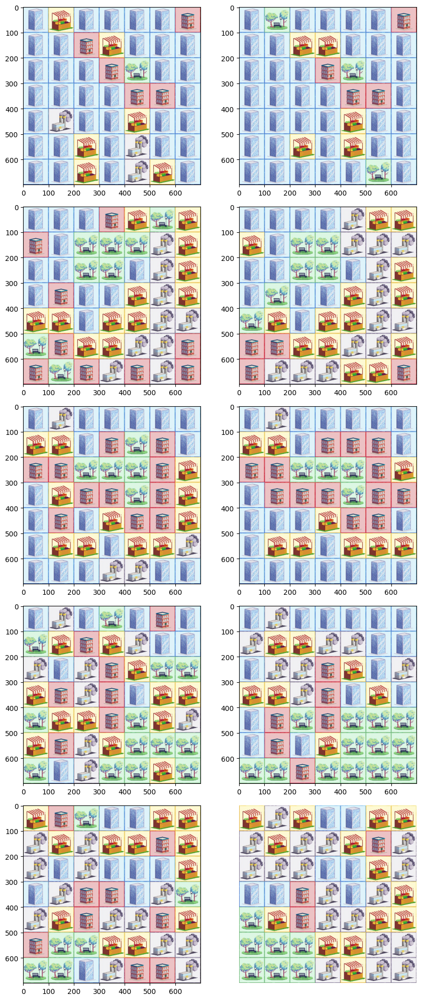

In [ ]:
def reconstruct_from_vae(model, samples, device='cpu'):
    #Function to reconstruct city grids
    with torch.no_grad(): #Faster inference if model does not need to calculate gradients
        samples = model(samples)[0] #Pass samples through VAE
        samples = samples.permute(0, 2, 3, 1) #Reshuffle dimensions to be [batch, x, y, district]
        samples = argmax_sample(samples) #Can switch to probabilistic sample
    return samples.to('cpu').numpy()

def plot_reconstruction(originals, reconstructions):
    # Function to plot reconstructed city grids alongside originals
    n = len(originals)
    fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(9, 4*n))
    for i in range(n): # Loop over the grids
        plot_grid_image(originals[i], on_ax=axes[i, 0]) # Plot original on the left
        plot_grid_image(reconstructions[i], on_ax=axes[i, 1]) #Plot reconstructed on the right
    fig.tight_layout()
    plt.show()

originals = np.random.choice(np.arange(len(grids)), size=5, replace=False) #Select 5 random indices
reconstructions = reconstruct_from_vae(model, grids_tensor[originals], device) #Reconstruct
plot_reconstruction(grids[originals], reconstructions) #Compare

Ok, time for the big moment! Let's generate some fresh city designs from the VAE. We will use the probabilistic sampling here, but you are free to adjust.

<Figure size 640x480 with 0 Axes>

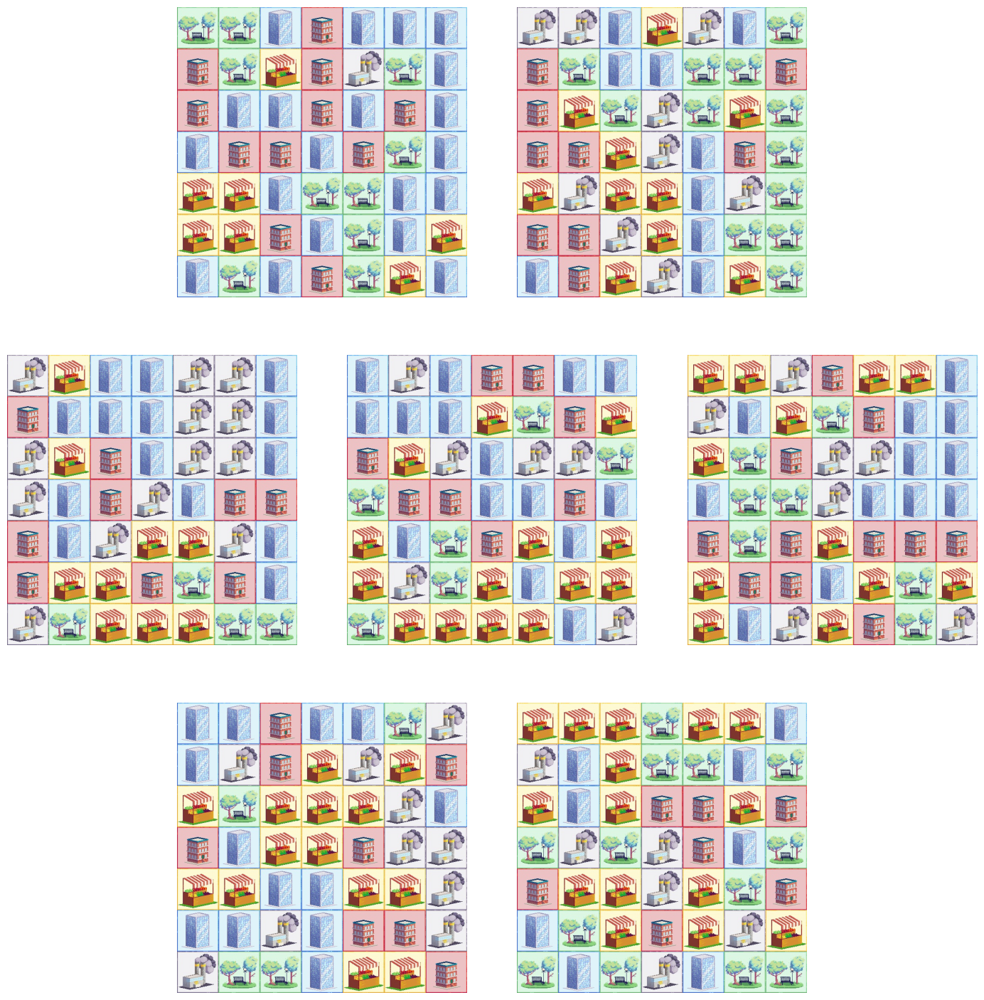

In [ ]:
def sample_from_vae(model, num_samples, latent_dim, device='cpu'):
    #Function to generate new samples from VAE
    with torch.no_grad():
        z = torch.randn(num_samples, latent_dim, device=device) #Sample from N(0,1) Gaussian
        samples = model.decoder(z) #Pass noise into decoder to sample a batch of  grid
        samples = samples.permute(0, 2, 3, 1) #Reshuffle dimensions to be [batch, x, y, district]
        samples = probabilistic_sample(samples) #Can switch to argmax sample
    return samples.to('cpu').numpy()
samples = sample_from_vae(model, 7, latent_dim, device)
plot_n_grids(samples) #Plot generated grids

Let's compare the score distributions across generated samples to the dataset. For a baseline, we will also try randomly generated grids where each grid location is sampled independently and uniformly. Note: these scores are calculated according to our trained regressors and may not be perfectly accurate!

In [ ]:
generated_samples = sample_from_vae(model, 1000, latent_dim, device) #Sample from VAE
random_samples = np.random.choice(np.arange(5), size = (1000,7,7)) #Randomly Sample Grids

In [ ]:
def score_samples(samples): #Function to score all samples. Requires trained regressors in all_predictors object
    samples = samples.reshape(samples.shape[0], 49) #Reformat data into the format regressors expect
    samples = pd.DataFrame(samples, columns = range(grids_subset.shape[1]), dtype = "object")
    sample_predictions = []
    for i in range(4): #Loop over advisores
        predictor = all_predictors[i] #Select appropriate regressor
        sample_predictions.append(predictor.predict(samples)) #Call regressor
    sample_predictions = np.stack(sample_predictions).T #Stack scores together
    return sample_predictions
generated_sample_predictions = score_samples(generated_samples)
random_sample_predictions = score_samples(random_samples)

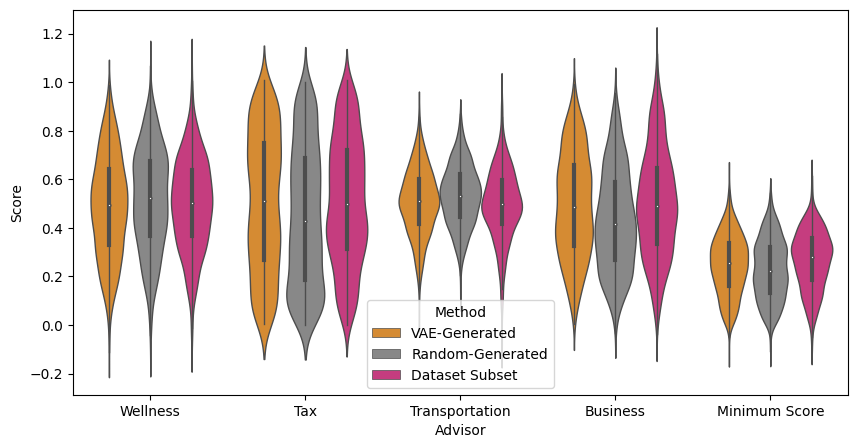

In [ ]:
import seaborn as sns
def compare_violinplots(all_predictions, all_names):
    #Wrangle dataframe predictions into the format expected by seaborn violinplot
    all_dfs = []
    for i in range(len(all_predictions)):
        df = pd.DataFrame(all_predictions[i], columns=["Wellness", "Tax", "Transportation", "Business"])
        df["Minimum Score"] = np.min(df.values, axis=1) #Calculate minimum score over the four advisors for every grid
        df = pd.melt(df, var_name = "Advisor", value_name = "Score")
        df['Method'] = all_names[i]
        all_dfs.append(df)
    all_dfs = pd.concat(all_dfs, axis=0)
    plt.figure(figsize=(10,5))

    #Plot the distributions
    sns.violinplot(x="Advisor", y="Score", hue="Method", data=all_dfs, linewidth=1, palette = ["#F08E18", "#888888", "#DC267F"])

all_predictions = [generated_sample_predictions, random_sample_predictions, final_prediction_array[:1000]] #Select only the last 1000 of the dataset for speed
all_names = ["VAE-Generated", "Random-Generated", "Dataset Subset"]
compare_violinplots(all_predictions, all_names) #Plot!

If you trained strong regressors, you should likely see that the dataset is much better performing, compared to random sampling. While the VAE may not generate quite as strong-performing designs as the dataset on average, it should generate better designs than the random sampler. Note: these observatons may not be apparant with a weak regressor.